# Parameters

In [1]:
import scanpy as sc
import os

In [2]:
adata = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [59]:
import pandas as pd
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import os

output_folder = "/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31"

sc.settings.verbosity = 3
sc.settings.set_figure_params(dpi=300, facecolor='white')

def run_clustering_new(adata, n_top_genes, n_neighbors, n_pcs, min_dist, resolution, distance_metric, regress_out_total_counts, save_prefix=""):
    # Preprocessing
    adata_processed = sc.pp.filter_genes(adata, min_cells=3, copy=True)
    adata_processed.layers['raw_counts'] = adata_processed.X
    sc.pp.normalize_total(adata_processed, target_sum=1e4, key_added="Normalize")
    sc.pp.log1p(adata_processed)
    adata_processed.layers['logNorm'] = adata_processed.X
    adata_processed.raw = adata_processed
    sc.pp.highly_variable_genes(adata_processed, n_top_genes=n_top_genes)
    adata_processed_HVG = adata_processed[:, adata_processed.var['highly_variable'] == True]
    
    # Regress out total counts if specified
    if regress_out_total_counts:
        sc.pp.regress_out(adata_processed_HVG, ['UMI_count'])
    sc.pp.scale(adata_processed_HVG, max_value=10)
    
    # PCA, Neighbors, UMAP
    sc.tl.pca(adata_processed_HVG, n_comps=n_pcs, svd_solver='arpack')
    sc.pp.neighbors(adata_processed_HVG, n_neighbors=n_neighbors, n_pcs=n_pcs, metric=distance_metric)
    sc.tl.umap(adata_processed_HVG, min_dist=min_dist)
    
    # Plot UMAP and save with parameters in title and filename
    title = f"UMAP | n_neighbors={n_neighbors}, n_pcs={n_pcs}, min_dist={min_dist:.2f}"
    filename = f"{save_prefix}_n_neighbors{n_neighbors}_n_pcs{n_pcs}_min_dist{min_dist:.2f}.png"
    sc.pl.umap(
        adata_processed_HVG,
        color="unsup_celltype",
        title=title,
        legend_loc="on data",
        legend_fontsize=3,
        save=filename
    )
    
    return adata_processed_HVG


In [ ]:
adata_clustered = run_clustering_new(
    adata,
    n_top_genes=10000,
    n_neighbors=30,
    n_pcs=120,
    min_dist=0.1,
    resolution=0.5,
    distance_metric="cosine",
    regress_out_total_counts=False,
    save_prefix="neurons"
)


In [113]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

# Leiden

In [93]:
adata_clustered.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31/all_data_combined_post_scrublet_neuron_30_120_0.01.h5ad")

In [150]:
adata.obs = adata.obs.loc[:, ~adata.obs.columns.str.contains("leiden")]
adata.uns = {key: value for key, value in adata.uns.items() if "leiden" not in key}

In [108]:
# Retrieve the 2D array of UMAP coordinates
umap_coords = adata_clustered.obsm["X_umap"]

# Create two new columns in `adata_clustered.obs`
adata_clustered.obs["UMAP_1_neuron"] = umap_coords[:, 0]
adata_clustered.obs["UMAP_2_neuron"] = umap_coords[:, 1]

# Now this CSV includes UMAP coordinates
adata_clustered.obs.to_csv(f"/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:31/df_cell_post_1fo58_1.csv")

In [147]:
adata.obsm = adata_clustered.obsm.copy()

In [146]:
adata.uns = adata_clustered.uns.copy()

In [145]:
adata.obsp = adata_clustered.obsp.copy()

In [144]:
# Create two new columns in `adata_clustered.obs`
adata.obs["UMAP_1_neuron"] = umap_coords[:, 0]
adata.obs["UMAP_2_neuron"] = umap_coords[:, 1]

In [157]:
for res in [0.2]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 23 clusters and added
    'leiden_res_0.20_neuron', the cluster labels (adata.obs, categorical) (0:07:40)


In [158]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [159]:
for res in [0.4]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 32 clusters and added
    'leiden_res_0.40_neuron', the cluster labels (adata.obs, categorical) (0:09:45)


In [160]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [161]:
for res in [0.6]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 46 clusters and added
    'leiden_res_0.60_neuron', the cluster labels (adata.obs, categorical) (0:07:10)


In [162]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [163]:
for res in [0.8]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 49 clusters and added
    'leiden_res_0.80_neuron', the cluster labels (adata.obs, categorical) (0:07:45)


In [164]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [165]:
for res in [1.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 55 clusters and added
    'leiden_res_1.00_neuron', the cluster labels (adata.obs, categorical) (0:10:03)


In [166]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [167]:
for res in [1.2]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 58 clusters and added
    'leiden_res_1.20_neuron', the cluster labels (adata.obs, categorical) (0:08:32)


In [168]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [169]:
for res in [1.4]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 60 clusters and added
    'leiden_res_1.40_neuron', the cluster labels (adata.obs, categorical) (0:13:51)


In [170]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [171]:
for res in [1.6]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 65 clusters and added
    'leiden_res_1.60_neuron', the cluster labels (adata.obs, categorical) (0:11:19)


In [172]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [1.8]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering


In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [2.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [3]:
for res in [3.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [4]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [4.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [6.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [8.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [10.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [12.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [14.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [16.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [18.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [20.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [25.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [50.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [75.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering


In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

In [ ]:
for res in [100.0]:
    sc.tl.leiden(
        adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
adata.write_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2025:01:22/all_data_combined_post_scrublet_neuron.h5ad")

# Annotation

In [188]:
adata.obs.loc[adata.obs['unsup_celltype'] == 'PNG', 'unsup_celltype'] = np.nan

In [193]:
adata.obs.loc[adata.obs['unsup_celltype'] == 'CONE_2', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'CONE_1', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'R8', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'OLCTG', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'RNPG', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'PGM', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'MUS', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'LEMG', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'CBG', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'OCHG', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'R7', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'ENSG', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'EPI', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'FAT_2', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'HE', 'unsup_celltype'] = np.nan
adata.obs.loc[adata.obs['unsup_celltype'] == 'R1-6', 'unsup_celltype'] = np.nan

In [47]:
import numpy as np
import pandas as pd

# Ensure it's a string first
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

# Correct NaN handling: Replace string "nan" with actual NaN
adata.obs.loc[adata.obs['neuron_celltype'] == "nan", 'neuron_celltype'] = np.nan

# Now correctly assign NaN to 'unsup_celltype' where 'neuron_celltype' is NaN
adata.obs.loc[adata.obs['neuron_celltype'].isna(), 'neuron_celltype'] = np.nan

# Convert to categorical
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype("category")


In [201]:
adata.obs['neuron_celltype'] = np.nan

In [271]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

In [9]:
import numpy as np

In [204]:
import numpy as np
import pandas as pd

# Ensure it's a string first
adata.obs['unsup_celltype'] = adata.obs['unsup_celltype'].astype(str)

# Correct NaN handling: Replace string "nan" with actual NaN
adata.obs.loc[adata.obs['unsup_celltype'] == "nan", 'unsup_celltype'] = np.nan

# Now correctly assign NaN to 'unsup_celltype' where 'neuron_celltype' is NaN
adata.obs.loc[adata.obs['unsup_celltype'].isna(), 'unsup_celltype'] = np.nan

# Convert to categorical
adata.obs['unsup_celltype'] = adata.obs['unsup_celltype'].astype("category")


In [199]:
del adata.uns['unsup_celltype_colors']

## 4.00

In [ ]:
sc.pl.umap(adata, color = 'leiden_res_4.00_neuron', legend_loc = 'on data', legend_fontsize = 4)

In [66]:
import numpy as np

In [259]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

In [218]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '10', 'neuron_celltype'] = 'T1'

In [210]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '11', 'neuron_celltype'] = 'Mi1'

/tmp/ipykernel_63658/1166249058.py:1: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'Mi1' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '11', 'neuron_celltype'] = 'Mi1'


In [211]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '61', 'neuron_celltype'] = 'Lai'

In [212]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '19', 'neuron_celltype'] = 'Tm1'

In [213]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '77', 'neuron_celltype'] = 'Dm9'

In [214]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '74', 'neuron_celltype'] = 'LAWF1'

In [215]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '73', 'neuron_celltype'] = 'LAWF2'

In [216]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '25', 'neuron_celltype'] = 'L3'

In [217]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '16', 'neuron_celltype'] = 'L1'

In [219]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '9', 'neuron_celltype'] = 'L2'

In [220]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '55', 'neuron_celltype'] = 'L4'

In [221]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '6', 'neuron_celltype'] = 'KCab'

In [222]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '7', 'neuron_celltype'] = 'KCy'

In [223]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '33', 'neuron_celltype'] = 'KCapbp'

In [224]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '53', 'neuron_celltype'] = 'L5'

In [225]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '29', 'neuron_celltype'] = 'C3'

In [226]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '41', 'neuron_celltype'] = 'T3'

In [227]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '36', 'neuron_celltype'] = 'T2'

In [231]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '67', 'neuron_celltype'] = 'TmY14'

In [232]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '87', 'neuron_celltype'] = 'Pm4'

In [233]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '38', 'neuron_celltype'] = 'T2a'

In [237]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '50', 'neuron_celltype'] = 'Tm9'

In [238]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '26', 'neuron_celltype'] = 'Mi4'

In [142]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_2.00_neuron'] == '54', 'neuron_celltype'] = 'Dm2'

In [98]:
adata.obs.loc[adata.obs['leiden_res_2.00_neuron'] == '53', 'neuron_celltype'] = 'TmY14'

In [239]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '65', 'neuron_celltype'] = 'Dm10'

In [240]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '27', 'neuron_celltype'] = 'Tm4'

In [241]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '23', 'neuron_celltype'] = 'Tm2'

In [242]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '32', 'neuron_celltype'] = 'C2'

In [243]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '83', 'neuron_celltype'] = 'dFB'

In [244]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '94', 'neuron_celltype'] = 'TYRN'

In [245]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '85', 'neuron_celltype'] = 'LC4'

In [246]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '22', 'neuron_celltype'] = 'Tm5a'

In [250]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '78', 'neuron_celltype'] = 'CLKN'

In [251]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '56', 'neuron_celltype'] = 'AL-PN'

In [252]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '69', 'neuron_celltype'] = 'PB'

In [255]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '70', 'neuron_celltype'] = 'TmY4'

In [256]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '68', 'neuron_celltype'] = 'Dm2'

In [260]:
adata.obs.loc[adata.obs['leiden_res_4.00_neuron'] == '2', 'neuron_celltype'] = 'T4T5'

## 6.00

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique annotation labels
unique_annotations = adata.obs['leiden_res_6.00_neuron'].unique()

# Generate a large set of distinct colors
num_colors = len(unique_annotations)
palette = sns.color_palette("tab20", num_colors)  # Use "tab20", "tab20b", "tab20c", or "hsv" for more colors
color_dict = dict(zip(unique_annotations, palette))

# Assign colors to annotation categories
sc.pl.umap(adata, color='leiden_res_6.00_neuron', palette=color_dict, legend_loc='on data', legend_fontsize=4)


In [295]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

In [266]:
adata.obs.loc[adata.obs['leiden_res_6.00_neuron'] == '58', 'neuron_celltype'] = 'EB-RN'

In [296]:
adata.obs.loc[adata.obs['leiden_res_6.00_neuron'] == '65', 'neuron_celltype'] = 'TmY3'

In [297]:
adata.obs.loc[adata.obs['leiden_res_6.00_neuron'] == '114', 'neuron_celltype'] = 'Pm3'

In [319]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_6.00_neuron'] == '66', 'neuron_celltype'] = 'TmY8'

## 8.00

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique annotation labels
unique_annotations = adata.obs['leiden_res_8.00_neuron'].unique()

# Generate a large set of distinct colors
num_colors = len(unique_annotations)
palette = sns.color_palette("tab20", num_colors)  # Use "tab20", "tab20b", "tab20c", or "hsv" for more colors
color_dict = dict(zip(unique_annotations, palette))

# Assign colors to annotation categories
sc.pl.umap(adata, color='leiden_res_8.00_neuron', palette=color_dict, legend_loc='on data', legend_fontsize=4)


In [314]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_8.00_neuron'] == '76', 'neuron_celltype'] = 'Mi15'

In [321]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_8.00_neuron'] == '30', 'neuron_celltype'] = 'Dm3'

In [350]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_8.00_neuron'] == '47', 'neuron_celltype'] = 'TmY5a'

## 10.00

In [311]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'Tm4', 'neuron_celltype'] = np.nan

In [331]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_10.00_neuron'] == '43', 'neuron_celltype'] = 'Tm4'

In [426]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'Dm3', 'neuron_celltype'] = np.nan

In [427]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_10.00_neuron'] == '30', 'neuron_celltype'] = 'Dm3'

In [474]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_10.00_neuron'] == '161', 'neuron_celltype'] = 'LC20'

## 14.00

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique annotation labels
unique_annotations = adata.obs['leiden_res_14.00_neuron'].unique()

# Generate a large set of distinct colors
num_colors = len(unique_annotations)
palette = sns.color_palette("tab20", num_colors)  # Use "tab20", "tab20b", "tab20c", or "hsv" for more colors
color_dict = dict(zip(unique_annotations, palette))

# Assign colors to annotation categories
sc.pl.umap(adata, color='leiden_res_14.00_neuron', palette=color_dict, legend_loc='on data', legend_fontsize=1)


In [316]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_14.00_neuron'] == '159', 'neuron_celltype'] = 'LC12'

In [317]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_14.00_neuron'] == '136', 'neuron_celltype'] = 'LC17'

In [353]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_14.00_neuron'] == '39', 'neuron_celltype'] = 'Tm20'

In [420]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'EB-RN', 'neuron_celltype'] = np.nan

In [421]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_14.00_neuron'] == '99', 'neuron_celltype'] = 'EB-RN'

## 20.00

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique annotation labels
unique_annotations = adata.obs['leiden_res_20.00_neuron'].unique()

# Generate a large set of distinct colors
num_colors = len(unique_annotations)
palette = sns.color_palette("tab20", num_colors)  # Use "tab20", "tab20b", "tab20c", or "hsv" for more colors
color_dict = dict(zip(unique_annotations, palette))

# Assign colors to annotation categories
sc.pl.umap(adata, color='leiden_res_20.00_neuron', palette=color_dict, legend_loc='on data', legend_fontsize=1)


In [434]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'AL-PN', 'neuron_celltype'] = np.nan

In [435]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_20.00_neuron'] == '117', 'neuron_celltype'] = 'AL-PN'

In [443]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'PB', 'neuron_celltype'] = np.nan

In [444]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_20.00_neuron'] == '83', 'neuron_celltype'] = 'PB'

In [475]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_20.00_neuron'] == '119', 'neuron_celltype'] = 'LC10ad'

In [488]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'LC6', 'neuron_celltype'] = np.nan

In [489]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_20.00_neuron'] == '91', 'neuron_celltype'] = 'LC6'

In [376]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_20.00_neuron'] == '30', 'neuron_celltype'] = 'Mi9'

In [375]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_20.00_neuron'] == '247', 'neuron_celltype'] = 'Tm5c'

## 25.00

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique annotation labels
unique_annotations = adata.obs['leiden_res_25.00_neuron'].unique()

# Generate a large set of distinct colors
num_colors = len(unique_annotations)
palette = sns.color_palette("tab20", num_colors)  # Use "tab20", "tab20b", "tab20c", or "hsv" for more colors
color_dict = dict(zip(unique_annotations, palette))

# Assign colors to annotation categories
sc.pl.umap(adata, color='leiden_res_25.00_neuron', palette=color_dict, legend_loc='on data', legend_fontsize=1)


In [309]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_25.00_neuron'] == '300', 'neuron_celltype'] = 'Pm1'

In [440]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'Tm20', 'neuron_celltype'] = np.nan

In [441]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_25.00_neuron'] == '125', 'neuron_celltype'] = 'Tm20'

In [454]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_25.00_neuron'] == '275', 'neuron_celltype'] = 'LPC1'

In [12]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'LPC1', 'neuron_celltype'] = np.nan

In [13]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'LC10ad', 'neuron_celltype'] = np.nan

In [14]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'LC6', 'neuron_celltype'] = np.nan

In [45]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_25.00_neuron'] == '164', 'neuron_celltype'] = 'LC14'

In [48]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'LC14', 'neuron_celltype'] = np.nan

In [55]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_25.00_neuron'] == '165', 'neuron_celltype'] = 'LPLC2'

In [54]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_25.00_neuron'] == '188', 'neuron_celltype'] = 'LPLC1'

## 50.00

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique annotation labels
unique_annotations = adata.obs['leiden_res_50.00_neuron'].unique()

# Generate a large set of distinct colors
num_colors = len(unique_annotations)
palette = sns.color_palette("tab20", num_colors)  # Use "tab20", "tab20b", "tab20c", or "hsv" for more colors
color_dict = dict(zip(unique_annotations, palette))

# Assign colors to annotation categories
sc.pl.umap(adata, color='leiden_res_50.00_neuron', palette=color_dict, legend_loc='on data', legend_fontsize=1)


In [341]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_50.00_neuron'] == '177', 'neuron_celltype'] = 'Dm4'

In [325]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_50.00_neuron'] == '120', 'neuron_celltype'] = 'Dm12'

In [326]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_50.00_neuron'] == '235', 'neuron_celltype'] = 'Dm1'

In [340]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_50.00_neuron'] == '366', 'neuron_celltype'] = 'Tm29'

In [406]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'TmY5a', 'neuron_celltype'] = np.nan

In [407]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_50.00_neuron'] == '67', 'neuron_celltype'] = 'TmY5a'

In [215]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_50.00_neuron'] == '272', 'neuron_celltype'] = 'DCN'

In [450]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_50.00_neuron'] == '196', 'neuron_celltype'] = 'LC22_LPLC4'

## Tm5c and Mi9

In [363]:
adata_sub = adata[adata.obs['leiden_res_18.00_neuron'] == '24'].copy()

In [ ]:
adata_clustered = run_clustering_new(
    adata_sub,
    n_top_genes=10000,
    n_neighbors=30,
    n_pcs=120,
    min_dist=0.1,
    resolution=0.5,
    distance_metric="cosine",
    regress_out_total_counts=False,
    save_prefix="18.00-24"
)


In [387]:
for res in [0.4]:
    sc.tl.leiden(
        adata_clustered, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.40_neuron', the cluster labels (adata.obs, categorical) (0:00:00)


In [388]:
adata_clustered

AnnData object with n_obs × n_vars = 5189 × 8516
    obs: 'sample', 'Unmatched_rate', 'UMI_count', 'Gene_count', 'PCR_batch', 'Ligation_barcodes', 'ShortdT_UMI_count', 'RandomN_UMI_count', 'RT_barcodes_shortdT', 'Plate_ID', 'order_bc', 'row', 'col', 'barcode', 'Conditions', 'priming', 'sample.1', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'RT_barcode', 'doublet_scores', 'doublet', 'unsup_celltype', 'sex', 'genotype', 'light_condition', 'batch', 'replicate', 'new_Conditions', 'timepoint', 'new_timepoint', 'final_Conditions', 'main_celltype', 'celltype_without_neurons', 'neuron_celltype', 'UMAP_1_neuron', 'UMAP_2_neuron', 'leiden_res_0.20_neuron', 'leiden_res_0.40_neuron', 'leiden_res_0.60_neuron', 'leiden_res_0.80_neuron', 'leiden_res_1.00_neuron', 'leiden_res_1.20_neuron', 'leiden_res_1.40_neuron', 'leiden_res_1.60_neuron'

In [ ]:
sc.pl.umap(adata_clustered, color = 'leiden_res_0.40_neuron', legend_loc = 'on data')

In [395]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.40_neuron'] == '0', 'neuron_celltype'] = 'Mi9'

In [396]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.40_neuron'] == '1', 'neuron_celltype'] = 'Mi9'

In [397]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.40_neuron'] == '2', 'neuron_celltype'] = 'Tm5c'

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


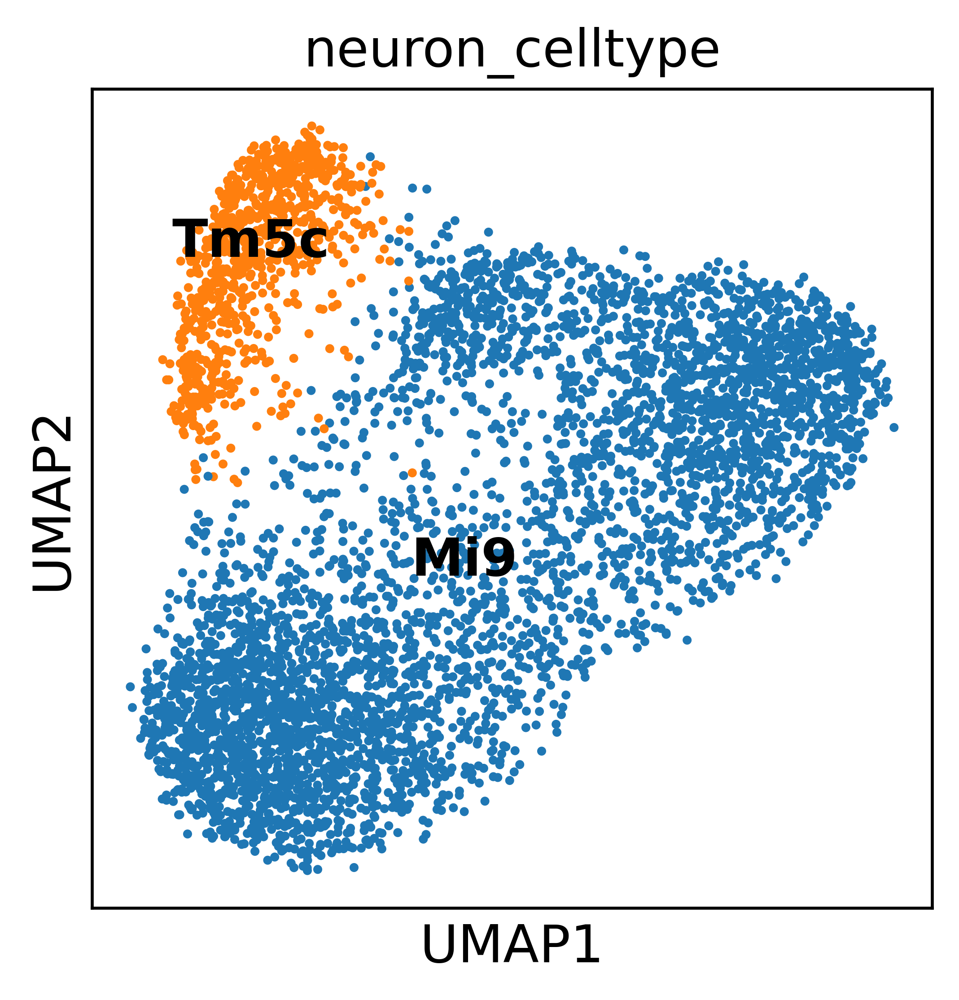

In [398]:
sc.pl.umap(adata_clustered, color = 'neuron_celltype', legend_loc = 'on data')

In [400]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

In [401]:
import pandas as pd

# Ensure sample names are aligned
matching_barcodes = adata.obs['sample'][adata.obs['sample'].isin(adata_clustered.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = adata_clustered.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


## T4T5

In [267]:
adata_sub = adata[adata.obs['leiden_res_4.00_neuron'] == '2'].copy()

In [ ]:
adata_clustered = run_clustering_new(
    adata_sub,
    n_top_genes=10000,
    n_neighbors=30,
    n_pcs=120,
    min_dist=0.01,
    resolution=0.5,
    distance_metric="cosine",
    regress_out_total_counts=False,
    save_prefix="18.00-24"
)


In [390]:
del adata_clustered.uns['unsup_celltype_colors']

In [ ]:
for res in [0.4]:
    sc.tl.leiden(
        adata_clustered, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

In [ ]:
sc.pl.umap(adata_clustered, color = 'leiden_res_0.40_neuron', legend_loc = 'on data')

In [ ]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.40_neuron'] == '0', 'neuron_celltype'] = 'Mi9'

In [ ]:
sc.pl.umap(adata_clustered, color = 'neuron_celltype', legend_loc = 'on data')

In [ ]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

import pandas as pd

# Ensure sample names are aligned
matching_barcodes = adata.obs['sample'][adata.obs['sample'].isin(adata_clustered.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = adata_clustered.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


#### Try integration with FCA and Ozel using Harmony

In [517]:
adata_subset = adata_sub.copy()
# Normalize and log-transform `ozel`
sc.pp.normalize_total(adata_subset, target_sum=1e4)
sc.pp.log1p(adata_subset)
sc.pp.highly_variable_genes(adata_subset, flavor='seurat', n_top_genes=7000, inplace=True)


fca_subset = fca[fca.obs['annotation_converted'].isin([
    'T4T5cd', 
    'T4T5', 
    'T4T5ab'
])]
# Normalize and log-transform `ozel`
sc.pp.normalize_total(fca_subset, target_sum=1e4)
sc.pp.log1p(fca_subset)
sc.pp.highly_variable_genes(fca_subset, flavor='seurat', n_top_genes=7000, inplace=True)

ozel_subset = ozel[ozel.obs['annotation'].isin([
    'T4-5c/d', 
    'T4-5', 
    'T4-5a/b'
])]
# Normalize and log-transform `ozel`
sc.pp.normalize_total(ozel_subset, target_sum=1e4)
sc.pp.log1p(ozel_subset)
sc.pp.highly_variable_genes(ozel_subset, flavor='seurat', n_top_genes=7000, inplace=True)


# Identify mitochondrial genes
adata_subset.var['mt'] = adata_subset.var_names.str.startswith('mt:')
adata_subset.var['tRNA'] = adata_subset.var_names.str.contains('tRNA')
adata_subset.var['ribo'] = adata_subset.var_names.str.contains('rRNA')
# Identify mitochondrial genes
ozel_subset.var['mt'] = ozel_subset.var_names.str.startswith('mt:')
ozel_subset.var['tRNA'] = ozel_subset.var_names.str.contains('tRNA')
ozel_subset.var['ribo'] = ozel_subset.var_names.str.contains('rRNA')
# Identify mitochondrial genes
fca_subset.var['mt'] = fca_subset.var_names.str.startswith('mt:')
fca_subset.var['tRNA'] = fca_subset.var_names.str.contains('tRNA')
fca_subset.var['ribo'] = fca_subset.var_names.str.contains('rRNA')

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [529]:
# Find intersection of HVGs
shared_hvgs = (
    set(adata_subset.var_names[adata_subset.var['highly_variable']])
    & set(fca_subset.var_names[fca_subset.var['highly_variable']])
    & set(ozel_subset.var_names[ozel_subset.var['highly_variable']])
)

# Subset all datasets to shared HVGs
adata_subset = adata_subset[:, list(shared_hvgs)]
fca_subset = fca_subset[:, list(shared_hvgs)]
ozel_subset = ozel_subset[:, list(shared_hvgs)]

In [495]:
fca_subset

View of AnnData object with n_obs × n_vars = 2491 × 2859
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'cellID', 'ClusterID', 'annotation', 'RNA_snn_res.2', 'seurat_clusters', 'Size_Factor', 'annotation_converted'
    var: 'gene_short_name', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mt', 'tRNA', 'ribo'
    uns: 'log1p', 'hvg'
    layers: 'counts'

In [530]:
len(shared_hvgs)

2859

In [497]:
for name, obj in zip(["adata", "fca", "ozel"], [adata_subset, fca_subset, ozel_subset]):
    print(f"Checking {name}...")
    print("Duplicate obs_names:", obj.obs_names[obj.obs_names.duplicated()])
    print("Duplicate var_names:", obj.var_names[obj.var_names.duplicated()])


Checking adata...
Duplicate obs_names: Index([], dtype='object')
Duplicate var_names: Index([], dtype='object', name='gene_id')
Checking fca...
Duplicate obs_names: Index([], dtype='object', name='cellID')
Duplicate var_names: Index([], dtype='object', name='gene_id')
Checking ozel...
Duplicate obs_names: Index([], dtype='object', name='sample')
Duplicate var_names: Index([], dtype='object', name='gene_id')


In [531]:
combined_adata = ad.concat([adata_subset, fca_subset, ozel_subset], axis=0, join='outer', label='dataset', keys=['adata', 'fca', 'ozel'])

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/anndata/_core/merge.py:1279: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  concat_annot = pd.concat(


In [521]:
combined_adata = ad.concat([adata_subset, fca_subset], axis=0, join='outer', label='dataset', keys=['adata', 'fca'])

In [532]:
# Ensure the column is categorical
if not pd.api.types.is_categorical_dtype(combined_adata.obs["Conditions"]):
    combined_adata.obs["Conditions"] = combined_adata.obs["Conditions"].astype("category")

# Add the new category
combined_adata.obs["Conditions"] = combined_adata.obs["Conditions"].cat.add_categories(["fca"])

# Assign the value
condition_mask = combined_adata.obs["dataset"] == "fca"
combined_adata.obs.loc[condition_mask, "Conditions"] = "fca"


/tmp/ipykernel_25669/886373520.py:2: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(combined_adata.obs["Conditions"]):


In [533]:
# Ensure the column is categorical
if not pd.api.types.is_categorical_dtype(combined_adata.obs["Conditions"]):
    combined_adata.obs["Conditions"] = combined_adata.obs["Conditions"].astype("category")

# Add the new category
combined_adata.obs["Conditions"] = combined_adata.obs["Conditions"].cat.add_categories(["ozel"])

# Assign the value
condition_mask = combined_adata.obs["dataset"] == "ozel"
combined_adata.obs.loc[condition_mask, "Conditions"] = "ozel"


/tmp/ipykernel_25669/4037822452.py:2: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if not pd.api.types.is_categorical_dtype(combined_adata.obs["Conditions"]):


In [534]:
# Identify mitochondrial genes
combined_adata.var["mitochondrial"] = combined_adata.var_names.str.startswith("mt:")

# Identify ribosomal genes (e.g., RPS and RPL prefixes)
combined_adata.var["ribosomal"] = combined_adata.var_names.str.contains(("rRNA"))

# Identify ribosomal genes (e.g., RPS and RPL prefixes)
combined_adata.var["tRNA"] = combined_adata.var_names.str.contains(("tRNA"))

combined_adata.var["exclude"] = (
    combined_adata.var["mitochondrial"] | 
    combined_adata.var["ribosomal"] | 
    combined_adata.var["tRNA"]
)


In [535]:
combined_adata.X = combined_adata.layers['counts']

In [536]:
# Normalize and log-transform
sc.pp.normalize_total(combined_adata, target_sum=1e4)
sc.pp.log1p(combined_adata)

# Identify HVGs
sc.pp.highly_variable_genes(combined_adata, flavor="seurat", batch_key='Conditions', n_top_genes=5000)

# Exclude mitochondrial, ribosomal, and tRNA genes from HVGs
combined_adata.var["highly_variable"] = combined_adata.var["highly_variable"] & ~combined_adata.var["exclude"]

# Subset to only highly variable genes
adata_hvg = combined_adata[:, combined_adata.var["highly_variable"]].copy()

# Scale only HVGs
sc.pp.scale(adata_hvg, max_value=10)


normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:237: RuntimeWarning: invalid value encountered in divide
  df['dispersions_norm'] = (
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:269: UserWarning: `n_top_genes` > number of normalized dispersions, returning all genes with normalized dispersions.
  warnings.warn(
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:237: RuntimeWar

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.
`n_top_genes` > `adata.n_var`, returning all genes.


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarn

`n_top_genes` > `adata.n_var`, returning all genes.
    finished (0:00:07)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:495: FutureWarning: The provided callable <function nanmean at 0x7f56b0321bd0> is currently using SeriesGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  df = df.groupby('gene').agg(
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:495: FutureWarning: The provi

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [537]:
# PCA on HVGs
sc.tl.pca(adata_hvg, n_comps=120)

computing PCA
    on highly variable genes
    with n_comps=120
    finished (0:01:46)


In [538]:
# Try harmony

import harmonypy as hm
ho = hm.run_harmony(adata_hvg.obsm['X_pca'], adata_hvg.obs, 'Conditions')
adata_hvg.obsm['X_harmony'] = ho.Z_corr.T
sc.pp.neighbors(adata_hvg, use_rep='X_harmony', n_neighbors=30, n_pcs=120)
sc.tl.umap(adata_hvg)


2025-02-15 15:47:00,123 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-02-15 15:47:39,868 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-02-15 15:47:40,222 - harmonypy - INFO - Iteration 1 of 10
2025-02-15 15:48:12,665 - harmonypy - INFO - Iteration 2 of 10
2025-02-15 15:48:44,996 - harmonypy - INFO - Converged after 2 iterations


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:40)


In [ ]:
sc.pl.umap(adata_hvg, color="annotation_converted", title="Harmony corrected umap (trimmed)", label = True, legend_loc='on data', legend_fontsize= 3, show=False)

In [ ]:
sc.pl.umap(adata_hvg, color="annotation", title="Harmony corrected umap (trimmed)", label = True, legend_loc='on data', legend_fontsize= 3, show=False)

In [ ]:
sc.pl.umap(adata_hvg, color="unsup_celltype", title="Harmony corrected umap (trimmed)", label = True, legend_loc='on data', legend_fontsize= 3, show=False)

In [428]:
adata_hvg.obs['sample1'] = adata_hvg.obs['sample'].copy()

In [433]:
adata_hvg.obs['sample2'] = adata_hvg.obs.index.copy()

In [492]:
adata_hvg

AnnData object with n_obs × n_vars = 63308 × 1995
    obs: 'sample', 'Unmatched_rate', 'UMI_count', 'Gene_count', 'PCR_batch', 'Ligation_barcodes', 'ShortdT_UMI_count', 'RandomN_UMI_count', 'RT_barcodes_shortdT', 'Plate_ID', 'order_bc', 'row', 'col', 'barcode', 'Conditions', 'priming', 'sample.1', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'RT_barcode', 'doublet_scores', 'doublet', 'unsup_celltype', 'sex', 'genotype', 'light_condition', 'batch', 'replicate', 'new_Conditions', 'timepoint', 'new_timepoint', 'final_Conditions', 'main_celltype', 'celltype_without_neurons', 'neuron_celltype', 'UMAP_1_neuron', 'UMAP_2_neuron', 'leiden_res_0.20_neuron', 'leiden_res_0.40_neuron', 'leiden_res_0.60_neuron', 'leiden_res_0.80_neuron', 'leiden_res_1.00_neuron', 'leiden_res_1.20_neuron', 'leiden_res_1.40_neuron', 'leiden_res_1.60_neuron

In [ ]:
adata_hvg.obs = adata_hvg.obs.groupby(adata_hvg.obs.index).first()


In [509]:
for res in [0.2]:
    sc.tl.leiden(
        adata_hvg, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 1 clusters and added
    'leiden_res_0.20_neuron', the cluster labels (adata.obs, categorical) (0:00:06)


In [510]:
for res in [0.4]:
    sc.tl.leiden(
        adata_hvg, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 3 clusters and added
    'leiden_res_0.40_neuron', the cluster labels (adata.obs, categorical) (0:00:13)


In [542]:
for res in [0.6]:
    sc.tl.leiden(
        adata_hvg, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 4 clusters and added
    'leiden_res_0.60_neuron', the cluster labels (adata.obs, categorical) (0:00:14)


In [549]:
for res in [0.8]:
    sc.tl.leiden(
        adata_hvg, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 7 clusters and added
    'leiden_res_0.80_neuron', the cluster labels (adata.obs, categorical) (0:00:19)


In [ ]:
adata_hvg.write_h5ad("adata_hvg.h5ad")

In [ ]:
sc.pl.umap(adata_hvg, color="leiden_res_0.80_neuron", title="Harmony corrected umap (trimmed)", label = True, legend_loc='on data', legend_fontsize= 3, show=False)

In [547]:
adata_hvg.obs['neuron_celltype'] = adata_hvg.obs['neuron_celltype'].astype(str)
adata_hvg.obs.loc[adata_hvg.obs['leiden_res_0.60_neuron'] == '0', 'neuron_celltype'] = 'T4T5'
adata_hvg.obs['neuron_celltype'] = adata_hvg.obs['neuron_celltype'].astype(str)
adata_hvg.obs.loc[adata_hvg.obs['leiden_res_0.60_neuron'] == '1', 'neuron_celltype'] = 'T4T5ab'
adata_hvg.obs['neuron_celltype'] = adata_hvg.obs['neuron_celltype'].astype(str)
adata_hvg.obs.loc[adata_hvg.obs['leiden_res_0.60_neuron'] == '2', 'neuron_celltype'] = 'T4T5cd'
adata_hvg.obs['neuron_celltype'] = adata_hvg.obs['neuron_celltype'].astype(str)
adata_hvg.obs.loc[adata_hvg.obs['leiden_res_0.60_neuron'] == '3', 'neuron_celltype'] = 'T4T5'

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


<Axes: title={'center': 'Harmony corrected umap (trimmed)'}, xlabel='UMAP1', ylabel='UMAP2'>

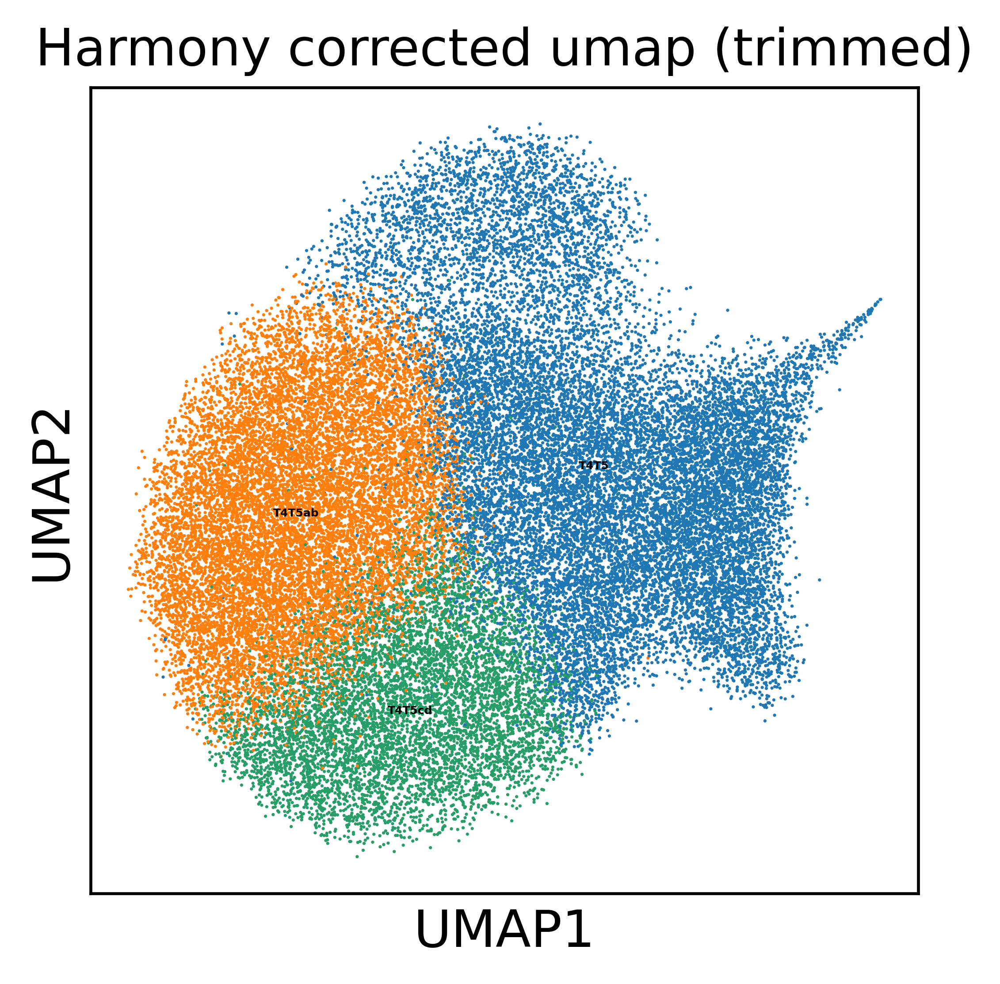

In [548]:
sc.pl.umap(adata_hvg, color="neuron_celltype", title="Harmony corrected umap (trimmed)", label = True, legend_loc='on data', legend_fontsize= 3, show=False)

In [551]:
adata_hvg.obs['neuron_celltype'] = adata_hvg.obs['neuron_celltype'].astype(str)
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

# Ensure sample names are aligned
matching_barcodes = adata.obs['sample'][adata.obs['sample'].isin(adata_hvg.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = adata_hvg.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


#### Trying integration with FCA and Ozel

In [326]:
fca = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2024:10:11/fca.h5ad")

In [272]:
print(fca.obs['annotation_converted'].unique().tolist())

['Unknown', 'LAWF2', 'T4T5', 'KCy', 'AudSN', 'CONE', 'R1-6', 'OCHG', 'OCR', 'KCapbp', 'L2', 'TmY8', 'OLCTG', 'Mi1', 'Dm8', 'T4T5ab', 'R7', 'EPI', 'T2a', 'KCab', 'SPG', 'Mi4', 'ORN', 'T2', 'Tm2', 'Dm3', 'KC', 'ENSG', 'T4T5cd', 'Dm10', 'L3', 'Mi9', 'T1', 'L4', 'R8', 'L5', 'JON', 'LAWF1', 'TMY4', 'Pm2', 'LC12', 'PNG', 'Tm9', 'PGM', 'Dm12', 'MUS', 'RNPG', 'FAT', 'Tm1', 'C2', 'Lai', 'L1', 'Tm3a', 'T3', 'LEMG', 'CBG', 'FAT_2', 'C3', 'ALPN', 'Mi15', 'TmY5a', 'Tm20', 'Pm4', 'Tm4', 'Dm11', 'EB-RN', 'DAN', 'PAM-DAN', 'TmY14', 'HE', 'Tm5c', 'Dm9', 'LC10', 'PHO', 'DRA', 'LC17', 'Dm29', 'OAN-TYRN', 'at4', 'PNGS', 'Gr21a-63a', 'ASTG']


In [346]:
fca_subset = fca[fca.obs['annotation_converted'].isin([
    'T4T5cd', 
    'T4T5', 
    'T4T5ab'
])]


In [347]:
adata_subset = adata_sub.copy()

In [276]:
ozel = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2024:10:11/ozel.h5ad")

In [278]:
print(ozel.obs['annotation'].unique().tolist())

['T4-5a/b', 'Tm4', 'Tm9v', '59', 'C3', 'TmY5a', '49', '88a', '105', '176', '45', 'T4-5c/d', 'G13', '44', '46', '221', '114', '22', 'Mi9', '67', 'G/LQ1', 'TmY4*', 'Dm12', '92', '62', '124', '102', 'T1', '57', '41', '191', 'C2', 'Tm1', 'G/LQ2', '83', 'Dm8', '103', '129', '36', 'L4', '96', 'T2', 'Tm3', '24', 'Lawf1', '88b', 'Tm5ab', '80', 'Tm2', '37', 'Tm20', '170', 'Dm2', 'G10', '73', '123', 'G11', 'LPC1', 'LLPC1', '138', 'T2a', 'Lawf2', 'Dm1', 'Mi15', '87', '56', '20', '5', 'L3', 'Lai', '51', '160', 'Dm3a', '69', '159', '82', '112', '29', 'Mi1', 'L2', 'TmY8*', '26', '68', 'Dm3b', '23', '84', 'Dm10', 'TmY3', '71', 'G16/LQ', 'Dm4', 'G14ab', '171', 'PR', 'T3', 'Pm4', '184', 'L5', 'Tm9d', 'LQ', 'Tm29', 'LC16', 'Mi4', '167', '94', 'G09', '85', 'LC12*', 'G/LQ4', '173', 'LPLC2', 'Dm11', '13', '52', '169a', '53', 'Tm5c', '81', '179', 'G07', '47', 'TmY14*', '43', 'G01', '50', 'discarded', '58', '174', '86', '63', '65', 'LC10a', 'L1', '95', 'G03', '116', 'LC14', '149', '90', '168', '48', '177', '

In [325]:
ozel_subset = ozel[ozel.obs['annotation'].isin([
    'T4-5c/d', 
    'T4-5', 
    'T4-5a/b'
])]


In [348]:
# Normalize and log-transform `ozel`
sc.pp.normalize_total(adata_subset, target_sum=1e4)
sc.pp.log1p(adata_subset)
sc.pp.highly_variable_genes(adata_subset, flavor='seurat', n_top_genes=5000, inplace=True)

normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [349]:
# Identify mitochondrial genes
adata_subset.var['mt'] = adata_subset.var_names.str.startswith('mt:')
adata_subset.var['tRNA'] = adata_subset.var_names.str.contains('tRNA')
adata_subset.var['ribo'] = adata_subset.var_names.str.contains('rRNA')

In [330]:
# Identify mitochondrial genes
ozel_subset.var['mt'] = ozel_subset.var_names.str.startswith('mt:')
ozel_subset.var['tRNA'] = ozel_subset.var_names.str.contains('tRNA')
ozel_subset.var['ribo'] = ozel_subset.var_names.str.contains('rRNA')

/tmp/ipykernel_25669/1475750219.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  ozel_subset.var['mt'] = ozel_subset.var_names.str.startswith('mt:')


In [331]:
# Normalize and log-transform `ozel`
sc.pp.normalize_total(ozel_subset, target_sum=1e4)
sc.pp.log1p(ozel_subset)

# Identify highly variable genes for `ozel`
sc.pp.highly_variable_genes(ozel_subset, flavor='seurat', n_top_genes=5000, inplace=True)

# Identify genes to exclude from common gene selection
excluded_genes = set(adata_subset.var_names[adata_subset.var['mt'] | adata_subset.var['tRNA'] | adata_subset.var['ribo']]) | \
                 set(ozel_subset.var_names[ozel_subset.var['mt'] | ozel_subset.var['tRNA'] | ozel_subset.var['ribo']])

# Get the original common genes based on highly variable genes
common_genes = list(set(adata_subset.var_names[adata_subset.var['highly_variable']]) &
                    set(ozel_subset.var_names[ozel_subset.var['highly_variable']]))

# Remove excluded genes from common genes
common_genes = list(set(common_genes) - excluded_genes)


normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [373]:

# Identify highly variable genes for `ozel`
sc.pp.highly_variable_genes(ozel_subset, flavor='seurat', n_top_genes=5000, inplace=True)

# Identify genes to exclude from common gene selection
excluded_genes = set(adata_subset.var_names[adata_subset.var['mt'] | adata_subset.var['tRNA'] | adata_subset.var['ribo']]) | \
                 set(ozel_subset.var_names[ozel_subset.var['mt'] | ozel_subset.var['tRNA'] | ozel_subset.var['ribo']])

# Get the original common genes based on highly variable genes
common_genes = list(set(adata_subset.var_names[adata_subset.var['highly_variable']]) &
                    set(ozel_subset.var_names[ozel_subset.var['highly_variable']]))

# Remove excluded genes from common genes
common_genes = list(set(common_genes) - excluded_genes)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [374]:
common_genes = list(set(adata_subset.var_names[adata_subset.var['highly_variable']]) &
                    set(ozel_subset.var_names[ozel_subset.var['highly_variable']])
                   )

In [375]:
len(common_genes)

1717

In [376]:
combined_adata = ad.concat([adata_subset, ozel_subset], axis=0, join='outer', label='dataset', keys=['adata','ozel'])

In [377]:
import scanorama
# Split into individual datasets by their batch labels for Scanorama
adata_list = [combined_adata[combined_adata.obs['dataset'] == batch] for batch in combined_adata.obs['dataset'].unique()]
# Integrate datasets with Scanorama
integrated_data = scanorama.correct_scanpy(adata_list, return_dimred=True)

# Concatenate the integrated datasets
integrated_adata = ad.concat(
    integrated_data,
    axis=0,
    label='dataset',
    keys = combined_adata.obs['dataset'].unique(),
    merge='same'
)
# Add Scanorama integrated embeddings
integrated_adata.obsm['X_scanorama'] = np.vstack([a.obsm['X_scanorama'] for a in integrated_data])
sc.tl.pca(integrated_adata, n_comps=80, svd_solver='arpack')
sc.pp.neighbors(integrated_adata, n_neighbors=50, n_pcs=80)
sc.tl.umap(integrated_adata, min_dist=0.1)

Found 20205 genes among all datasets
[[0.         0.17773655]
 [0.         0.        ]]
Processing datasets (0, 1)
computing PCA
    with n_comps=120
    finished (0:04:53)
computing neighbors
    using 'X_pca' with n_pcs = 80
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:58)


In [ ]:
sc.pl.umap(integrated_adata, color = 'annotation', legend_loc = 'on data', legend_fontsize=4)

In [ ]:
sc.pl.umap(integrated_adata, color = 'unsup_celltype', legend_loc = 'on data', legend_fontsize=4)

In [350]:
# Identify mitochondrial genes
fca_subset.var['mt'] = fca_subset.var_names.str.startswith('mt:')
fca_subset.var['tRNA'] = fca_subset.var_names.str.contains('tRNA')
fca_subset.var['ribo'] = fca_subset.var_names.str.contains('rRNA')

/tmp/ipykernel_25669/2067215918.py:2: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.
  fca_subset.var['mt'] = fca_subset.var_names.str.startswith('mt:')


In [351]:
# Normalize and log-transform `ozel`
sc.pp.normalize_total(fca_subset, target_sum=1e4)
sc.pp.log1p(fca_subset)

# Identify highly variable genes for `ozel`
sc.pp.highly_variable_genes(fca_subset, flavor='seurat', n_top_genes=5000, inplace=True)

# Identify genes to exclude from common gene selection
excluded_genes = set(adata_subset.var_names[adata_subset.var['mt'] | adata_subset.var['tRNA'] | adata_subset.var['ribo']]) | \
                 set(fca_subset.var_names[fca_subset.var['mt'] | fca_subset.var['tRNA'] | fca_subset.var['ribo']])

# Get the original common genes based on highly variable genes
common_genes = list(set(adata_subset.var_names[adata_subset.var['highly_variable']]) &
                    set(fca_subset.var_names[fca_subset.var['highly_variable']]))

# Remove excluded genes from common genes
common_genes = list(set(common_genes) - excluded_genes)


normalizing counts per cell
    finished (0:00:00)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [352]:
common_genes = list(set(adata_subset.var_names[adata_subset.var['highly_variable']]) &
                    set(fca_subset.var_names[fca_subset.var['highly_variable']])
                   )

In [ ]:
len(common_genes)

In [353]:
combined_adata = ad.concat([adata_subset, fca_subset], axis=0, join='outer', label='dataset', keys=['adata','fca']).copy()

In [354]:
import scanorama
# Split into individual datasets by their batch labels for Scanorama
adata_list = [combined_adata[combined_adata.obs['dataset'] == batch] for batch in combined_adata.obs['dataset'].unique()]
# Integrate datasets with Scanorama
integrated_data = scanorama.correct_scanpy(adata_list, return_dimred=True)

# Concatenate the integrated datasets
integrated_adata = ad.concat(
    integrated_data,
    axis=0,
    label='dataset',
    keys = combined_adata.obs['dataset'].unique(),
    merge='same'
)
# Add Scanorama integrated embeddings
integrated_adata.obsm['X_scanorama'] = np.vstack([a.obsm['X_scanorama'] for a in integrated_data])
sc.tl.pca(integrated_adata, n_comps=120, svd_solver='arpack')
sc.pp.neighbors(integrated_adata, n_neighbors=50, n_pcs=120)
sc.tl.umap(integrated_adata, min_dist=0.01)

Found 17918 genes among all datasets
[[0.         0.76073866]
 [0.         0.        ]]
Processing datasets (0, 1)
computing PCA
    with n_comps=120
    finished (0:02:23)
computing neighbors
    using 'X_pca' with n_pcs = 120
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:12)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:45)


## Dm8 and Dm11

In [403]:
adata_sub = adata[adata.obs['leiden_res_10.00_neuron'] == '49'].copy()

In [ ]:
adata_clustered = run_clustering_new(
    adata_sub,
    n_top_genes=10000,
    n_neighbors=30,
    n_pcs=120,
    min_dist=0.1,
    resolution=0.5,
    distance_metric="cosine",
    regress_out_total_counts=False,
    save_prefix="18.00-24"
)


In [412]:
for res in [0.6]:
    sc.tl.leiden(
        adata_clustered, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.60_neuron', the cluster labels (adata.obs, categorical) (0:00:00)


In [ ]:
sc.pl.umap(adata_clustered, color = 'leiden_res_0.60_neuron', legend_loc = 'on data')

In [415]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '2', 'neuron_celltype'] = 'Dm11'

In [414]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '0', 'neuron_celltype'] = 'Dm8'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '1', 'neuron_celltype'] = 'Dm8'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '3', 'neuron_celltype'] = 'Dm8'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '4', 'neuron_celltype'] = 'Dm8'

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


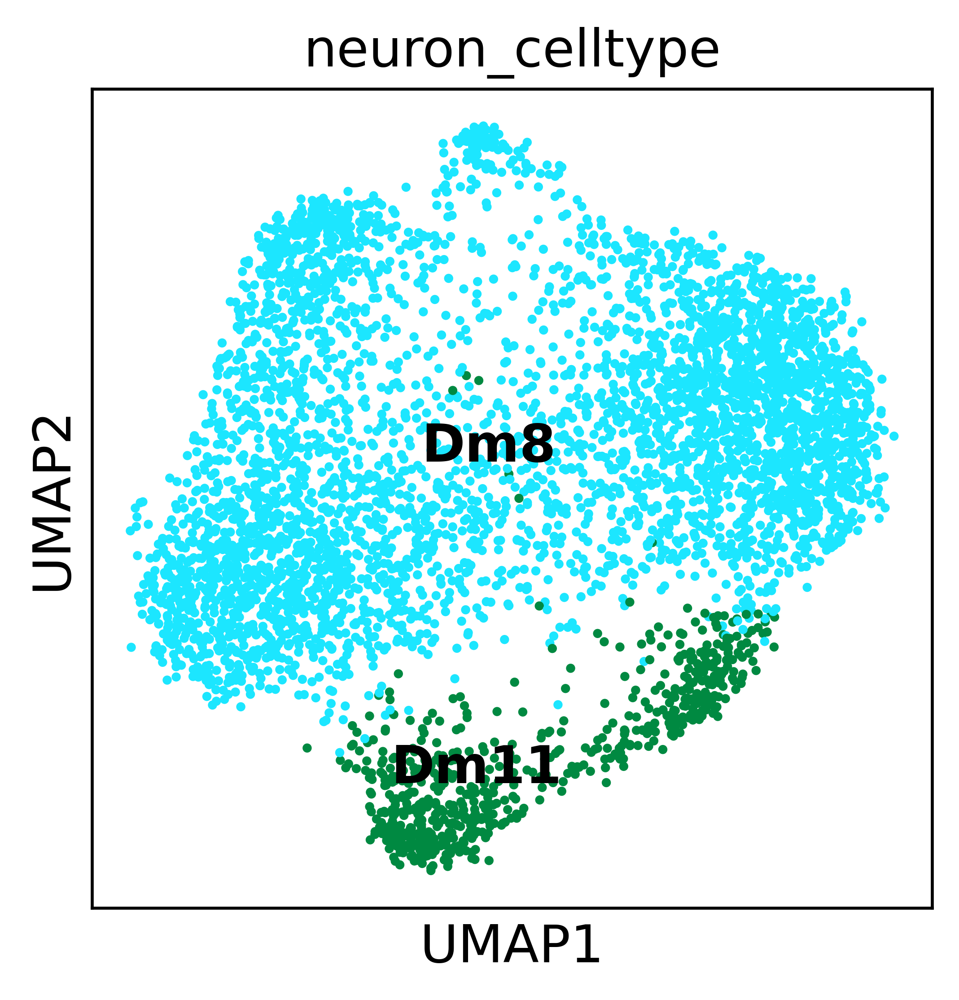

In [416]:
sc.pl.umap(adata_clustered, color = 'neuron_celltype', legend_loc = 'on data')

In [417]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

# Ensure sample names are aligned
matching_barcodes = adata.obs['sample'][adata.obs['sample'].isin(adata_clustered.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = adata_clustered.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


## JON, AudSN, ORN

In [58]:
adata_sub = adata[adata.obs['leiden_res_4.00_neuron'] == '35'].copy()

In [62]:
del adata_clustered.uns['unsup_celltype_colors']

In [ ]:
sc.pl.umap(adata_clustered, color = 'unsup_celltype')

In [ ]:
sc.pl.umap(adata_clustered, color = 'leiden_res_0.60_neuron', legend_loc = 'on data')

In [ ]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '0', 'neuron_celltype'] = 'Dm8'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '1', 'neuron_celltype'] = 'Dm8'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '3', 'neuron_celltype'] = 'Dm8'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '4', 'neuron_celltype'] = 'Dm8'

In [ ]:
sc.pl.umap(adata_clustered, color = 'neuron_celltype', legend_loc = 'on data')

In [ ]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

# Ensure sample names are aligned
matching_barcodes = adata.obs['sample'][adata.obs['sample'].isin(adata_clustered.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = adata_clustered.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


In [64]:
fca = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2024:10:11/fca.h5ad")

In [65]:
fca_subset = fca[fca.obs['annotation'].isin([
    'Johnston organ neuron', 
    'olfactory receptor neuron', 
    'auditory sensory neuron'
])]


In [66]:
adata_subset = adata_sub.copy()

In [67]:
# Normalize total counts per cell and log-transform both datasets
sc.pp.normalize_total(adata_subset, target_sum=1e4)
sc.pp.log1p(adata_subset)

sc.pp.normalize_total(fca_subset, target_sum=1e4)
sc.pp.log1p(fca_subset)

normalizing counts per cell
    finished (0:00:00)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:170: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


normalizing counts per cell
    finished (0:00:00)


In [68]:
sc.pp.highly_variable_genes(adata_subset, flavor='seurat', n_top_genes=5000, inplace=True)
sc.pp.highly_variable_genes(fca_subset, flavor='seurat', n_top_genes=5000, inplace=True)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [69]:
common_genes = list(set(adata_subset.var_names[adata_subset.var['highly_variable']]) &
                    set(fca_subset.var_names[fca_subset.var['highly_variable']]))

In [70]:
# Subset both datasets to these common genes
adata_subset = adata_subset[:, common_genes]
fca_subset = fca_subset[:, common_genes]


In [71]:
import anndata as ad

In [72]:
combined_adata = ad.concat([adata_subset, fca_subset], axis=0, join='outer', label='dataset', keys=['adata', 'fca'])

In [74]:
import scanorama
# Split into individual datasets by their batch labels for Scanorama
adata_list = [combined_adata[combined_adata.obs['dataset'] == batch] for batch in combined_adata.obs['dataset'].unique()]
# Integrate datasets with Scanorama
integrated_data = scanorama.correct_scanpy(adata_list, return_dimred=True)

# Concatenate the integrated datasets
integrated_adata = ad.concat(
    integrated_data,
    axis=0,
    label='dataset',
    keys = combined_adata.obs['dataset'].unique(),
    merge='same'
)
# Add Scanorama integrated embeddings
integrated_adata.obsm['X_scanorama'] = np.vstack([a.obsm['X_scanorama'] for a in integrated_data])
sc.tl.pca(integrated_adata, n_comps=120, svd_solver='arpack')
sc.pp.neighbors(integrated_adata, n_neighbors=50, n_pcs=120)
sc.tl.umap(integrated_adata, min_dist=0.01)

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


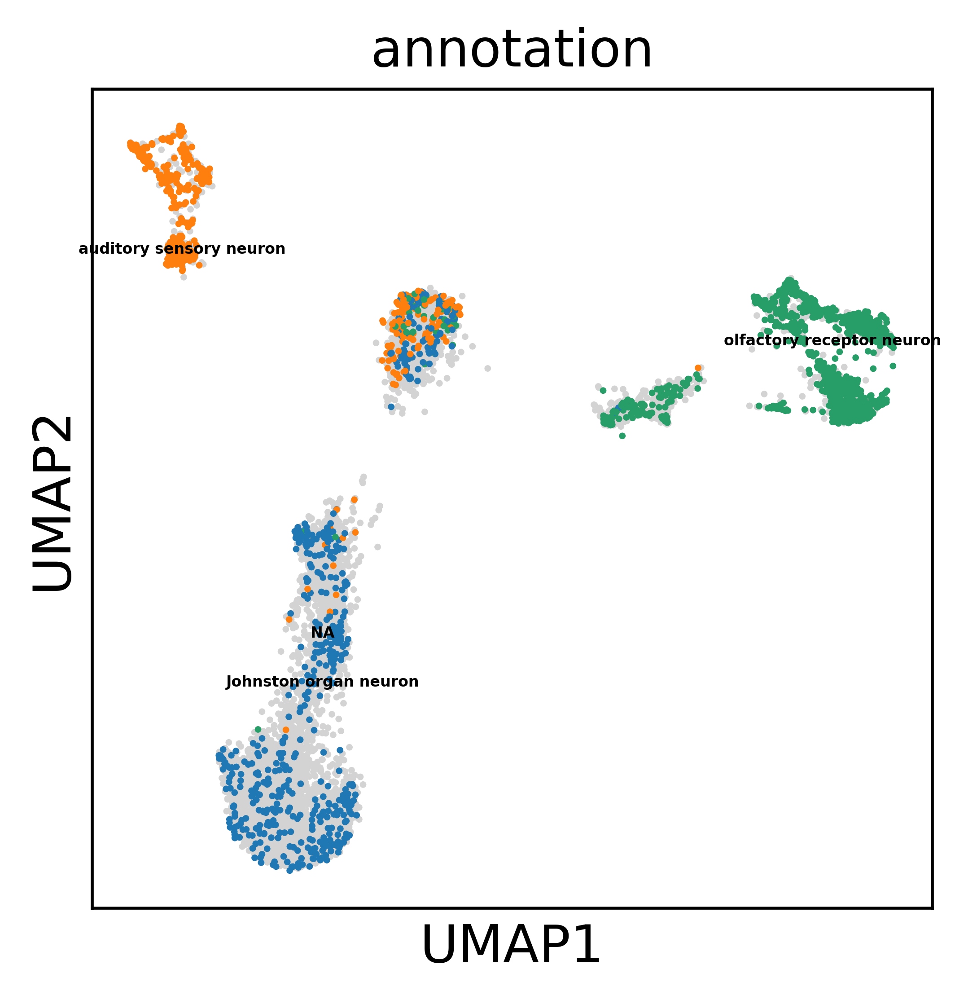

In [79]:
sc.pl.umap(integrated_adata, color = 'annotation', legend_loc = 'on data', legend_fontsize=4)

In [ ]:
sc.pl.umap(integrated_adata, color = 'unsup_celltype', legend_loc = 'on data', legend_fontsize=4)

In [81]:
for res in [0.6]:
    sc.tl.leiden(
        integrated_adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res_0.60_neuron', the cluster labels (adata.obs, categorical) (0:00:01)


In [ ]:
sc.pl.umap(integrated_adata, color = 'leiden_res_0.60_neuron', legend_loc = 'on data', legend_fontsize=4)

In [86]:
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '4', 'neuron_celltype'] = 'AudSN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '1', 'neuron_celltype'] = 'ORN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '5', 'neuron_celltype'] = 'ORN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '2', 'neuron_celltype'] = 'JON'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '0', 'neuron_celltype'] = 'JON'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '3', 'neuron_celltype'] = np.nan

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


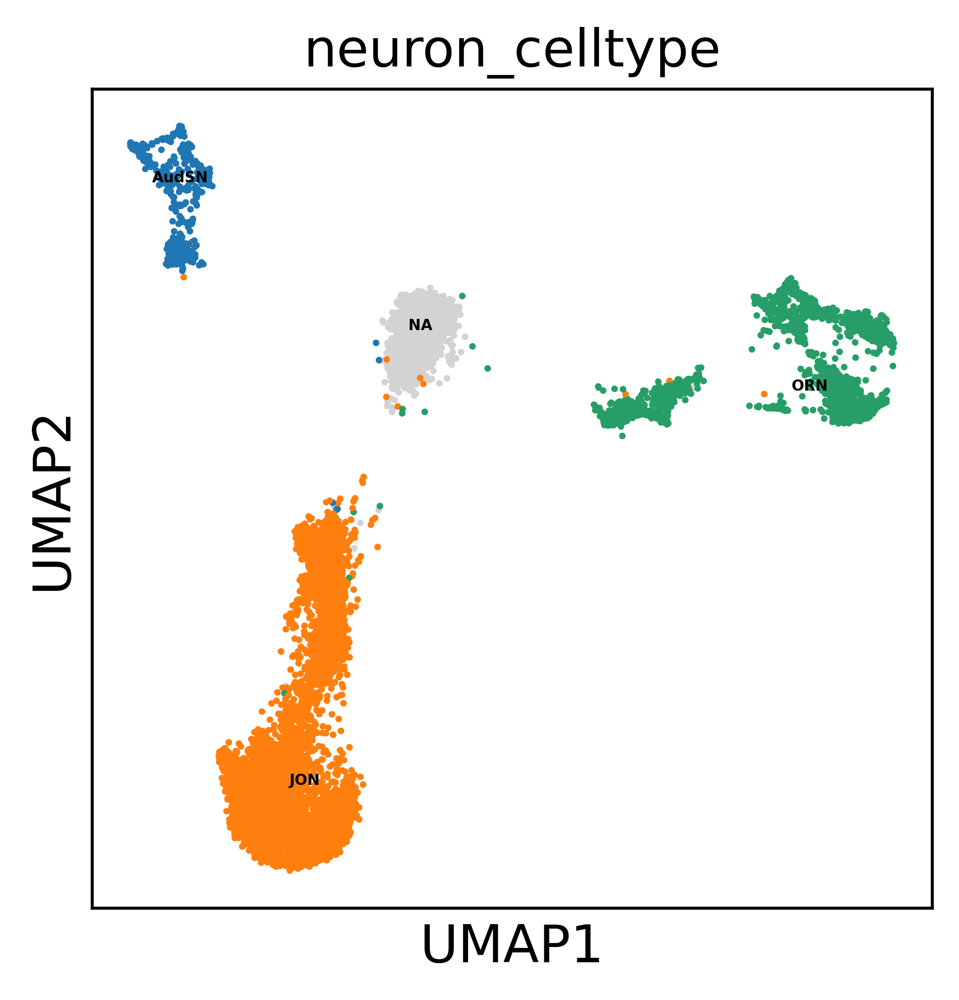

In [87]:
sc.pl.umap(integrated_adata, color = 'neuron_celltype', legend_loc = 'on data', legend_fontsize=4)

In [88]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)

# Ensure sample names are aligned
matching_barcodes = adata_clustered.obs['sample'][adata_clustered.obs['sample'].isin(integrated_adata.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = integrated_adata.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata_clustered.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


In [ ]:
sc.pl.umap(adata_clustered, color = 'neuron_celltype')

In [90]:
for res in [0.6]:
    sc.tl.leiden(
        adata_clustered, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 7 clusters and added
    'leiden_res_0.60_neuron', the cluster labels (adata.obs, categorical) (0:00:00)


In [ ]:
sc.pl.umap(adata_clustered, color = 'leiden_res_0.60_neuron')

In [92]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '0', 'neuron_celltype'] = 'JON'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '1', 'neuron_celltype'] = 'JON'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '2', 'neuron_celltype'] = np.nan
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '3', 'neuron_celltype'] = 'JON'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '4', 'neuron_celltype'] = 'ORN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '5', 'neuron_celltype'] = 'ORN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.60_neuron'] == '6', 'neuron_celltype'] = 'AudSN'


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


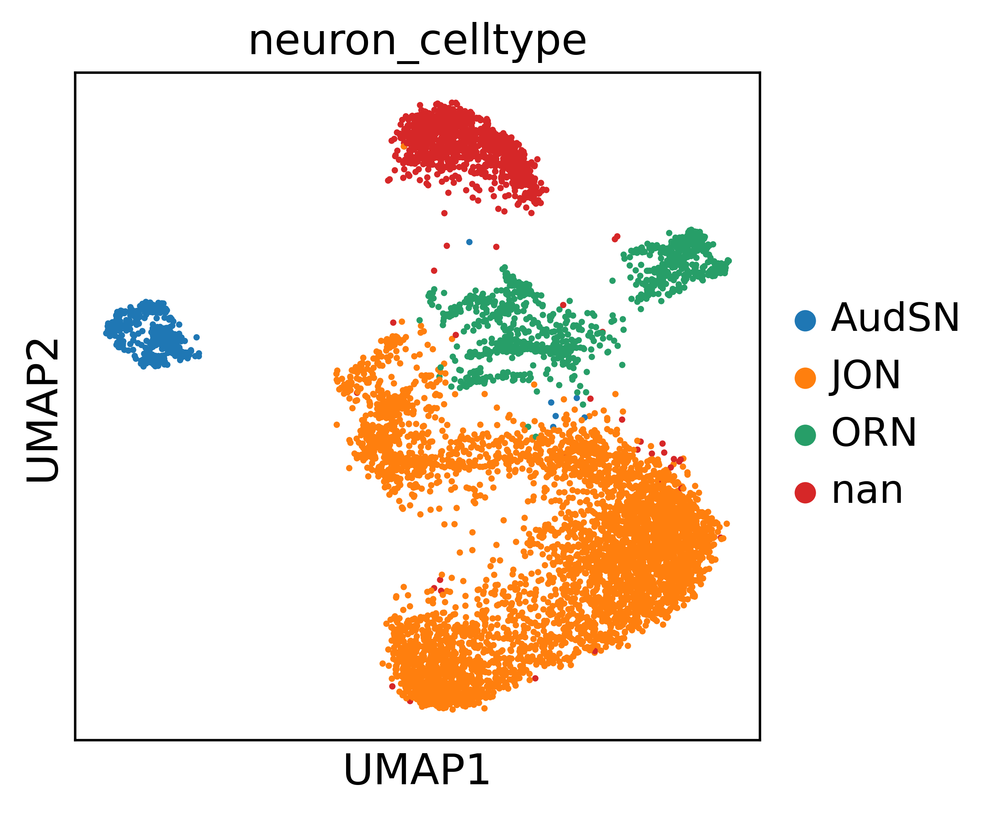

In [93]:
sc.pl.umap(adata_clustered, color = 'neuron_celltype')

In [94]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

# Ensure sample names are aligned
matching_barcodes = adata.obs['sample'][adata.obs['sample'].isin(adata_clustered.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = adata_clustered.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


## DAN, PAM-DAN, SERN, and OAN

### Trying without reannotating

In [247]:
adata_sub = adata[adata.obs['leiden_res_8.00_neuron'] == '35'].copy()

In [ ]:
adata_clustered = run_clustering_new(
    adata_sub,
    n_top_genes=10000,
    n_neighbors=30,
    n_pcs=120,
    min_dist=0.1,
    resolution=0.5,
    distance_metric="cosine",
    regress_out_total_counts=False,
    save_prefix="18.00-24"
)


In [249]:
del adata_clustered.uns['unsup_celltype_colors']

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


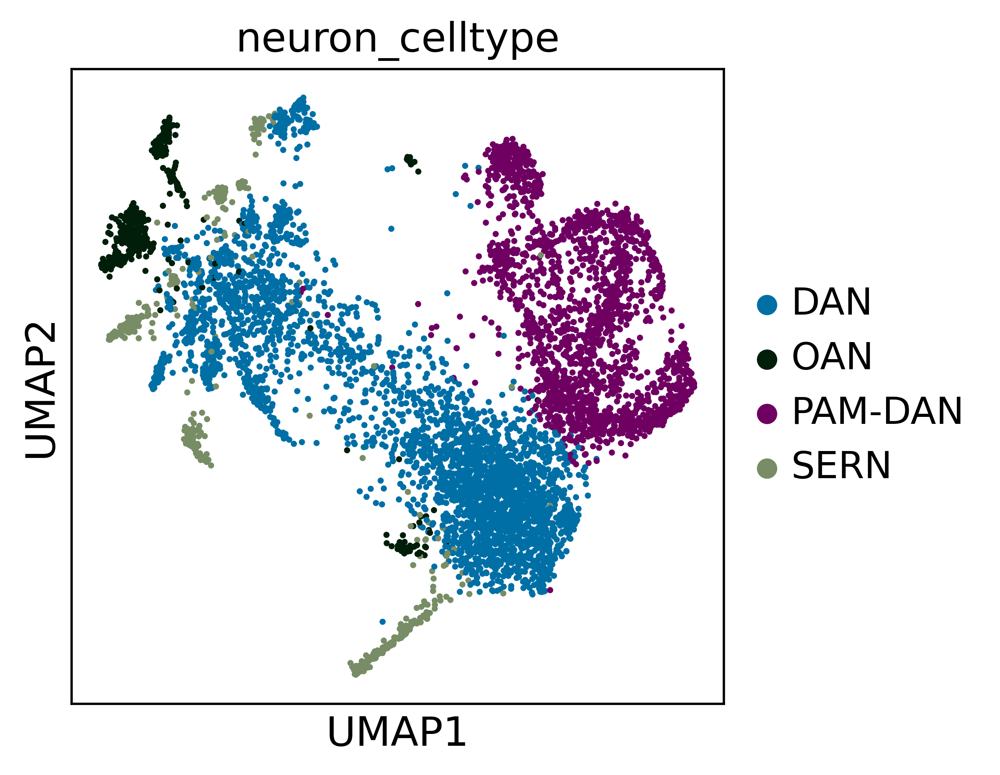

In [253]:
sc.pl.umap(adata_clustered, color = 'neuron_celltype')

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


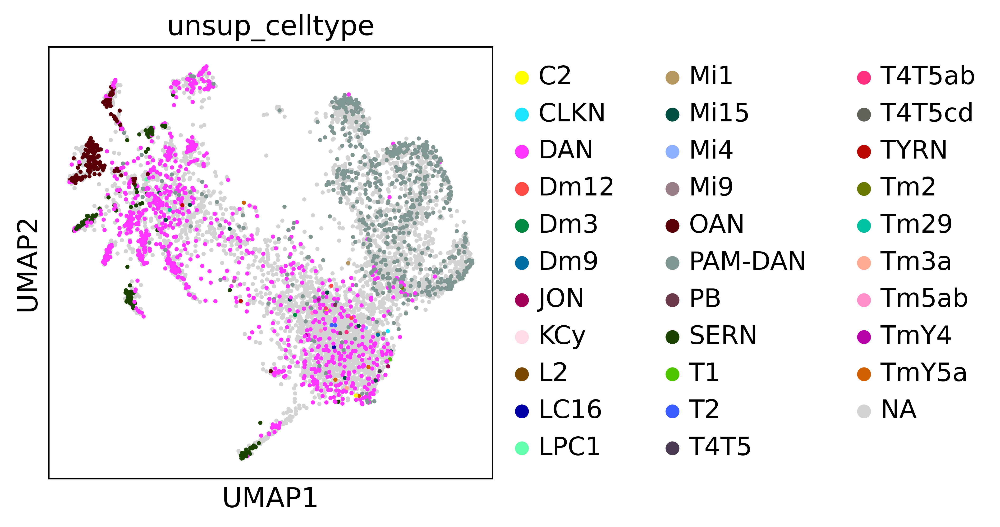

In [250]:
sc.pl.umap(adata_clustered, color = 'unsup_celltype')

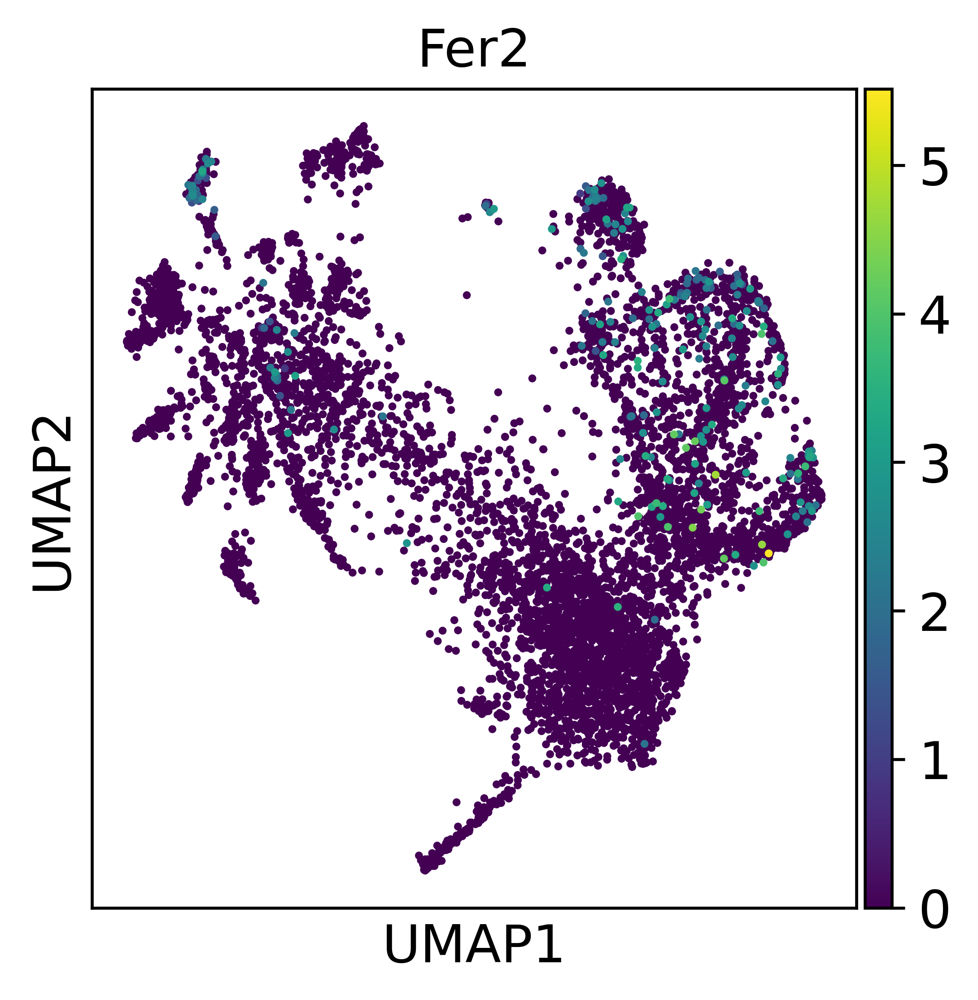

In [251]:
sc.pl.umap(adata_clustered, color = "Fer2")

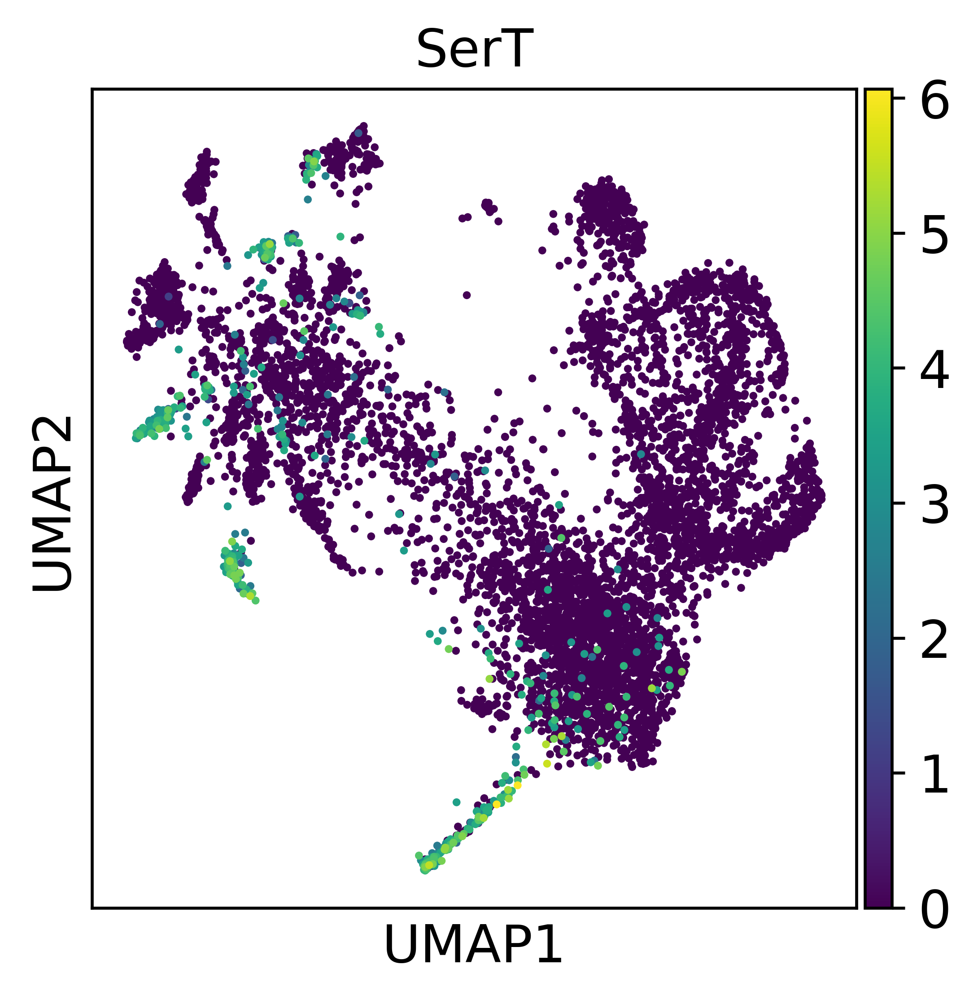

In [252]:
sc.pl.umap(adata_clustered, color = "SerT")

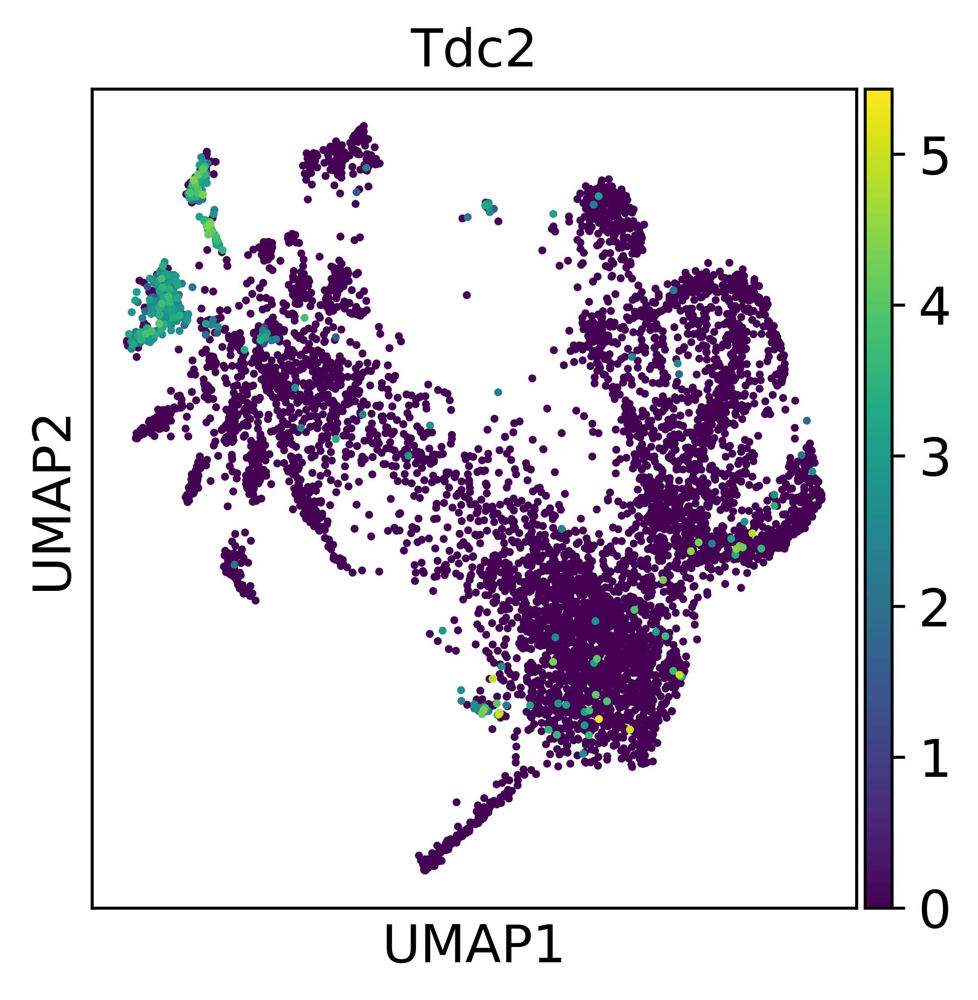

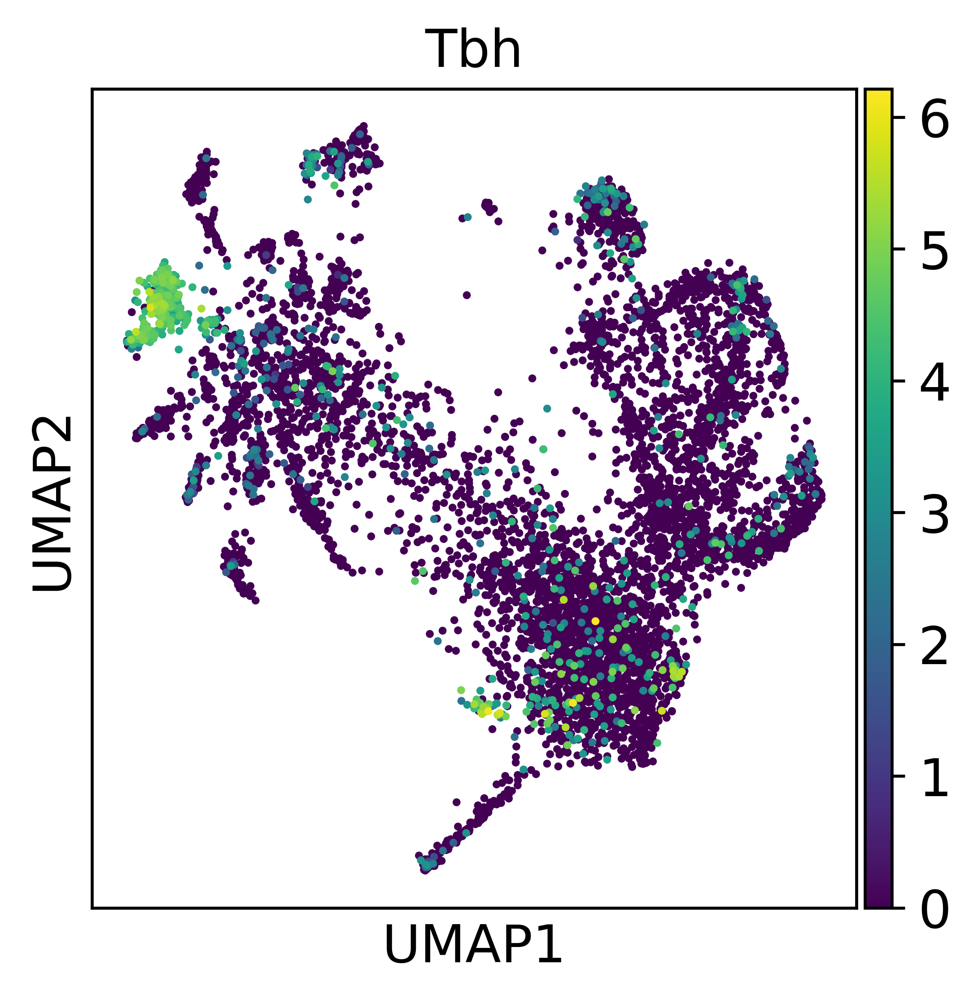

In [134]:
# OAN
sc.pl.umap(adata_clustered, color = "Tdc2")
sc.pl.umap(adata_clustered, color = "Tbh")


In [259]:
for res in [0.4]:
    sc.tl.leiden(
        adata_clustered, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.40_neuron', the cluster labels (adata.obs, categorical) (0:00:00)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


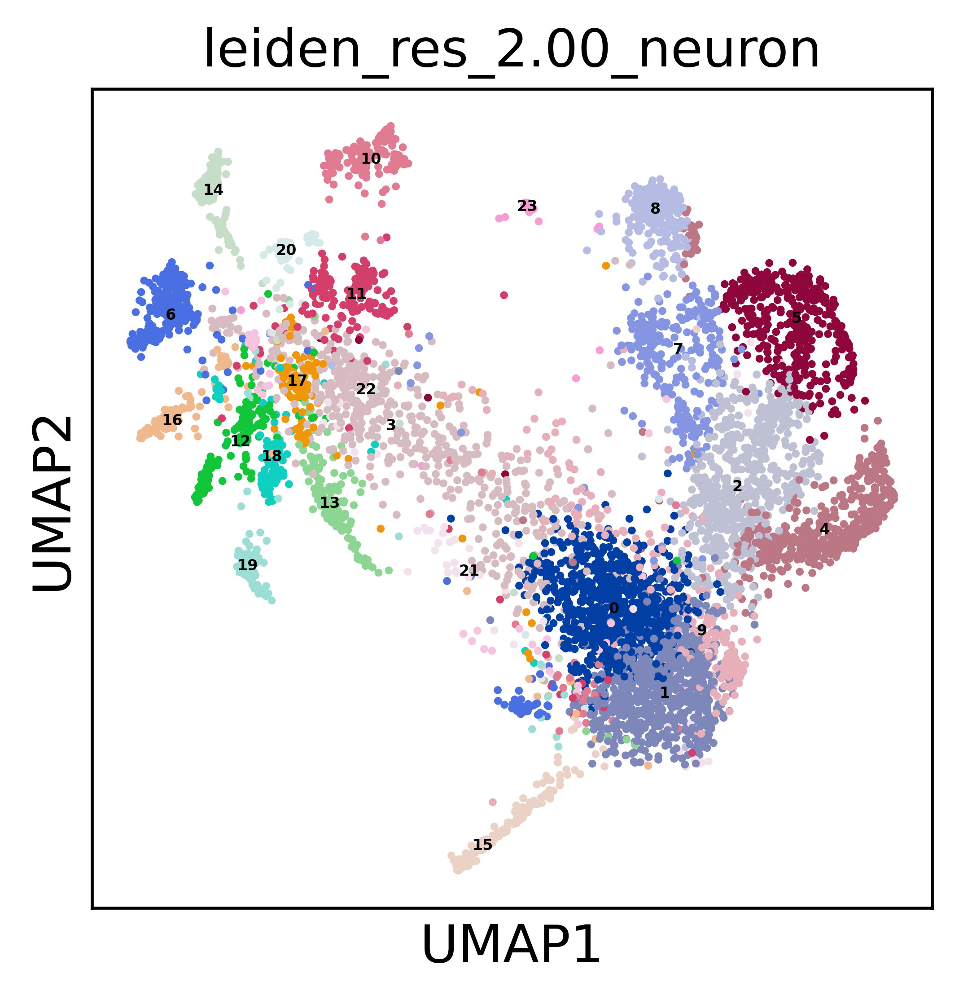

In [257]:
sc.pl.umap(adata_clustered, color = "leiden_res_2.00_neuron", legend_loc = 'on data', legend_fontsize=4)

In [262]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.40_neuron'] == '2', 'neuron_celltype'] = 'PAM-DAN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.40_neuron'] == '4', 'neuron_celltype'] = 'OAN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.40_neuron'] == '0', 'neuron_celltype'] = 'DAN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_0.40_neuron'] == '1', 'neuron_celltype'] = 'DAN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_2.00_neuron'] == '6', 'neuron_celltype'] = 'OAN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_2.00_neuron'] == '14', 'neuron_celltype'] = 'TYRN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_2.00_neuron'] == '15', 'neuron_celltype'] = 'SERN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_2.00_neuron'] == '19', 'neuron_celltype'] = 'SERN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_2.00_neuron'] == '16', 'neuron_celltype'] = 'SERN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_2.00_neuron'] == '20', 'neuron_celltype'] = 'SERN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_6.00_neuron'] == '40', 'neuron_celltype'] = 'SERN'
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata_clustered.obs.loc[adata_clustered.obs['leiden_res_2.00_neuron'] == '23', 'neuron_celltype'] = 'TYRN'

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


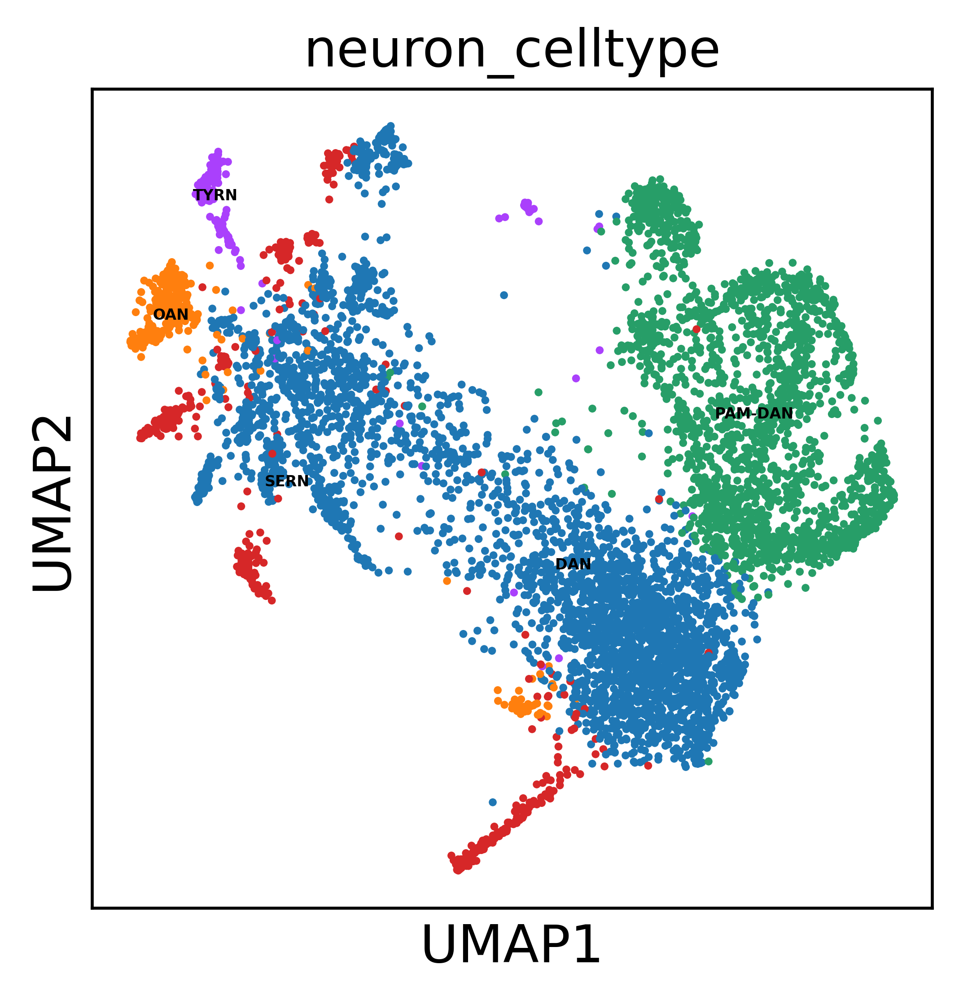

In [263]:
sc.pl.umap(adata_clustered, color = "neuron_celltype", legend_loc = 'on data', legend_fontsize=4)

In [264]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

# Ensure sample names are aligned
matching_barcodes = adata.obs['sample'][adata.obs['sample'].isin(adata_clustered.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = adata_clustered.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


### Trying with annotation with Dopp et al

In [162]:
dopp = sc.read_h5ad("/lustre/fs4/yng_lab/scratch/pkim/Singlecell/2024:10:11/dopp.h5ad")

In [164]:
print(dopp.obs['annotation'].unique().tolist())

['nonPAM', nan, 'ALG_0', 'y', 'EG_0', 'EG_2', 'ab', 'adPN', 'ALG', 'EG_1', 'abp', 'PG', 'dFB', '5-HT', 'PAM', 'T4/T5', 'CXG', 'ring_1', 'ring_2', 'Tm1/TmY8', 'PB', 'T1', 'Mi1', 'clock', 'Tyr', 'Oct']


In [166]:
dopp_sub = dopp[dopp.obs['annotation'].isin(['5-HT', 'Oct', 'PAM', 'nonPAM'])]

In [168]:
adata_subset = adata_sub.copy()

In [169]:
dopp_subset = dopp_sub.copy()

In [170]:
# Normalize total counts per cell and log-transform both datasets
sc.pp.normalize_total(adata_subset, target_sum=1e4)
sc.pp.log1p(adata_subset)

sc.pp.normalize_total(dopp_subset, target_sum=1e4)
sc.pp.log1p(dopp_subset)

normalizing counts per cell
    finished (0:00:00)
normalizing counts per cell
    finished (0:00:00)


In [171]:
sc.pp.highly_variable_genes(adata_subset, flavor='seurat', n_top_genes=5000, inplace=True)
sc.pp.highly_variable_genes(dopp_subset, flavor='seurat', n_top_genes=5000, inplace=True)


If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:216: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']


In [174]:
common_genes = list(set(adata_subset.var_names[adata_subset.var['highly_variable']]) &
                    set(dopp_subset.var_names[dopp_subset.var['highly_variable']]))

In [175]:
# Subset both datasets to these common genes
adata_subset = adata_subset[:, common_genes]
dopp_subset = dopp_subset[:, common_genes]


In [176]:
combined_adata = ad.concat([adata_subset, dopp_subset], axis=0, join='outer', label='dataset', keys=['adata', 'dopp'])

In [177]:
import scanorama
# Split into individual datasets by their batch labels for Scanorama
adata_list = [combined_adata[combined_adata.obs['dataset'] == batch] for batch in combined_adata.obs['dataset'].unique()]
# Integrate datasets with Scanorama
integrated_data = scanorama.correct_scanpy(adata_list, return_dimred=True)

# Concatenate the integrated datasets
integrated_adata = ad.concat(
    integrated_data,
    axis=0,
    label='dataset',
    keys = combined_adata.obs['dataset'].unique(),
    merge='same'
)
# Add Scanorama integrated embeddings
integrated_adata.obsm['X_scanorama'] = np.vstack([a.obsm['X_scanorama'] for a in integrated_data])
sc.tl.pca(integrated_adata, n_comps=120, svd_solver='arpack')
sc.pp.neighbors(integrated_adata, n_neighbors=50, n_pcs=120)
sc.tl.umap(integrated_adata, min_dist=0.01)

Found 623 genes among all datasets
[[0.         0.93041237]
 [0.         0.        ]]
Processing datasets (0, 1)
computing PCA
    with n_comps=120
    finished (0:00:04)
computing neighbors
    using 'X_pca' with n_pcs = 120
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:42)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


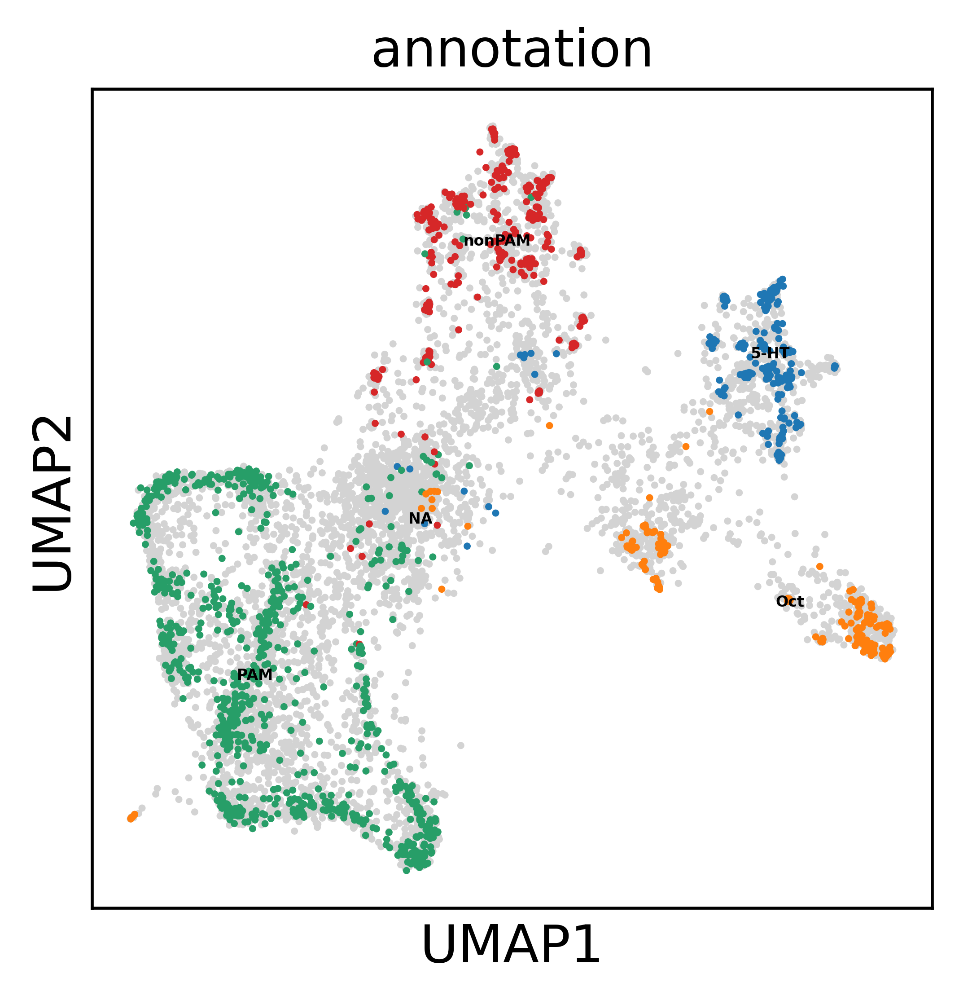

In [178]:
sc.pl.umap(integrated_adata, color = 'annotation', legend_loc = 'on data', legend_fontsize=4)

/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


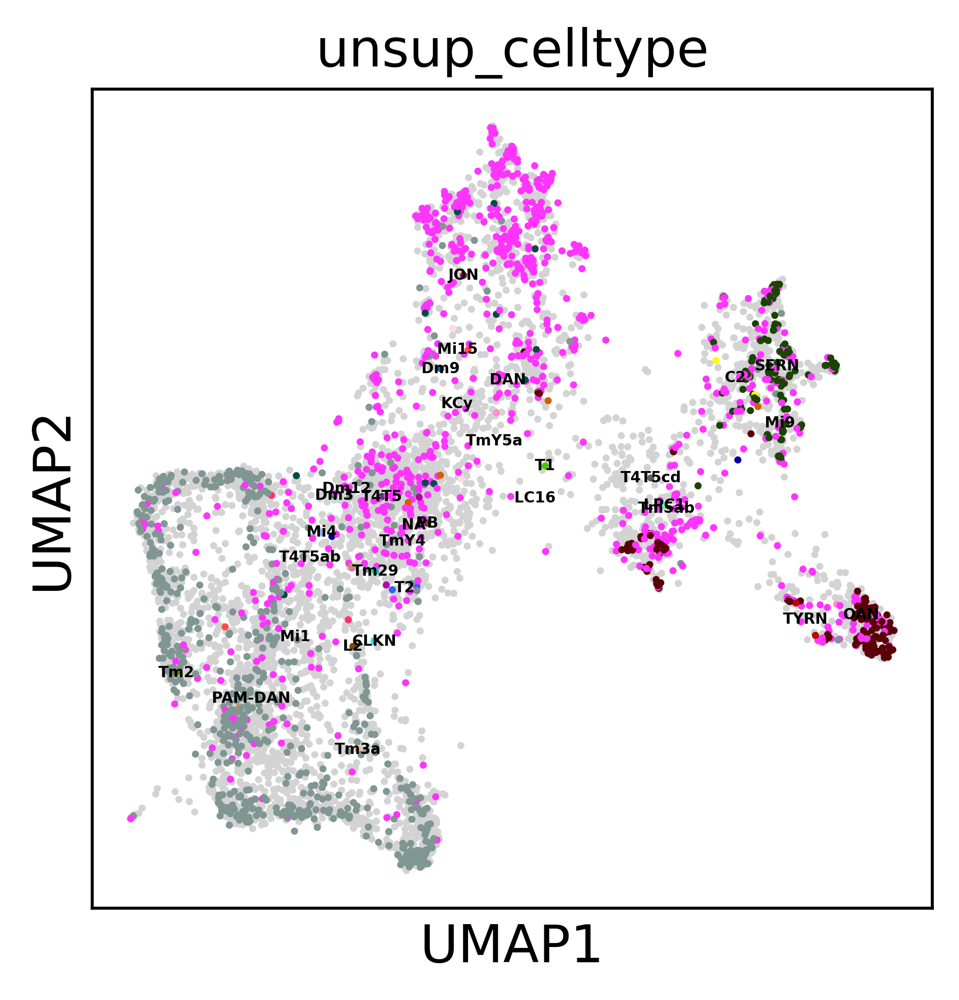

In [179]:
sc.pl.umap(integrated_adata, color = 'unsup_celltype', legend_loc = 'on data', legend_fontsize=4)

In [189]:
for res in [0.4]:
    sc.tl.leiden(
        integrated_adata, key_added=f"leiden_res_{res:4.2f}_neuron", resolution = res, #flavor = "igraph"
    )

running Leiden clustering
    finished: found 6 clusters and added
    'leiden_res_0.40_neuron', the cluster labels (adata.obs, categorical) (0:00:01)


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


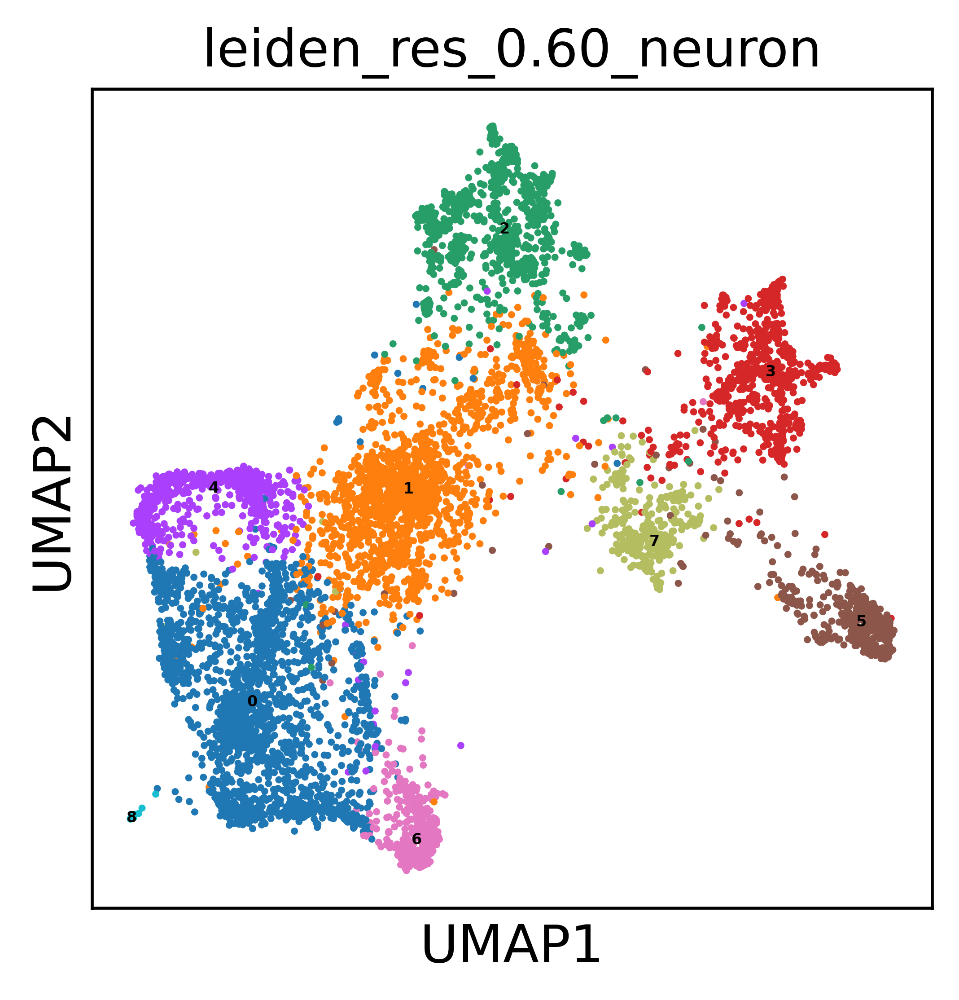

In [191]:
sc.pl.umap(integrated_adata, color = 'leiden_res_0.60_neuron', legend_loc = 'on data', legend_fontsize=4)

In [192]:
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '0', 'neuron_celltype'] = 'PAM-DAN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '1', 'neuron_celltype'] = 'PAM-DAN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '2', 'neuron_celltype'] = 'DAN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '3', 'neuron_celltype'] = 'SERN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '4', 'neuron_celltype'] = 'PAM-DAN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '5', 'neuron_celltype'] = 'OAN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '6', 'neuron_celltype'] = 'PAM-DAN'
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)
integrated_adata.obs.loc[integrated_adata.obs['leiden_res_0.60_neuron'] == '7', 'neuron_celltype'] = 'OAN'


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


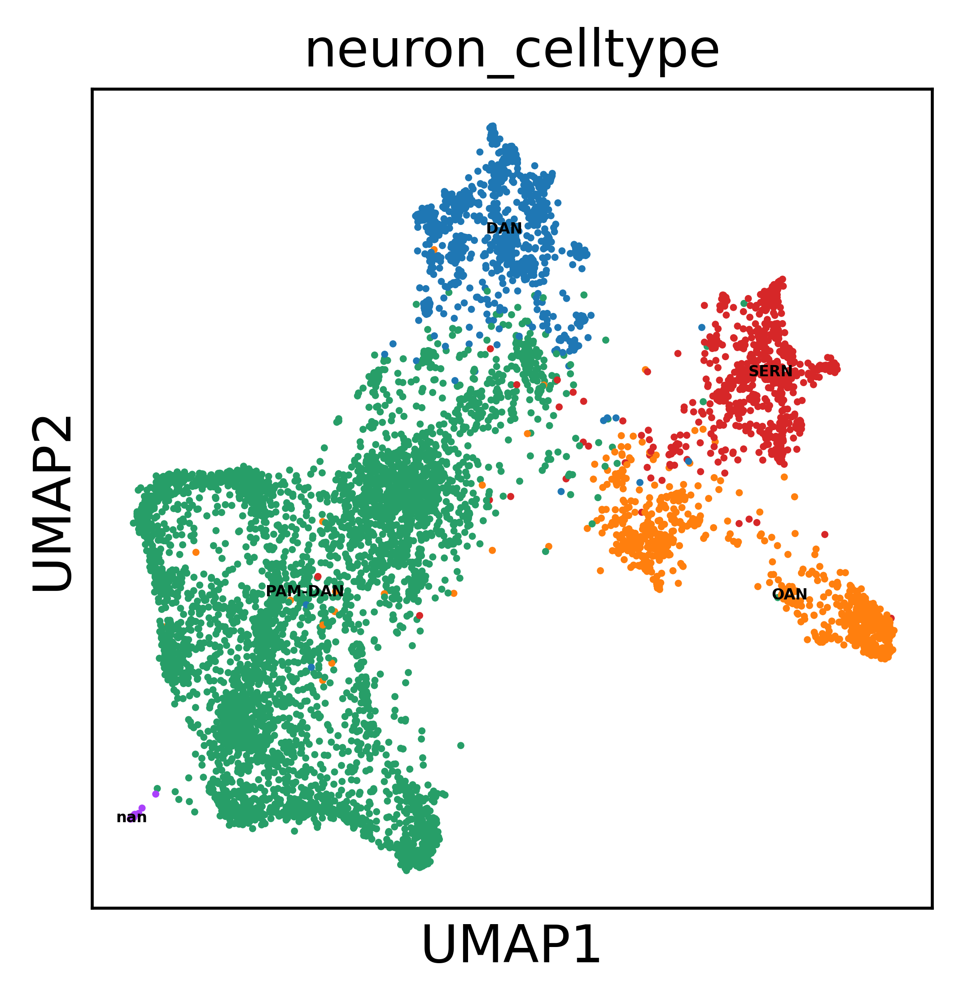

In [193]:
sc.pl.umap(integrated_adata, color = 'neuron_celltype', legend_loc = 'on data', legend_fontsize=4)

In [194]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
integrated_adata.obs['neuron_celltype'] = integrated_adata.obs['neuron_celltype'].astype(str)

# Ensure sample names are aligned
matching_barcodes = adata_clustered.obs['sample'][adata_clustered.obs['sample'].isin(integrated_adata.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = integrated_adata.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata_clustered.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1217: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/ru-auth/local/home/pkim/miniconda3/envs/workshop_2024/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


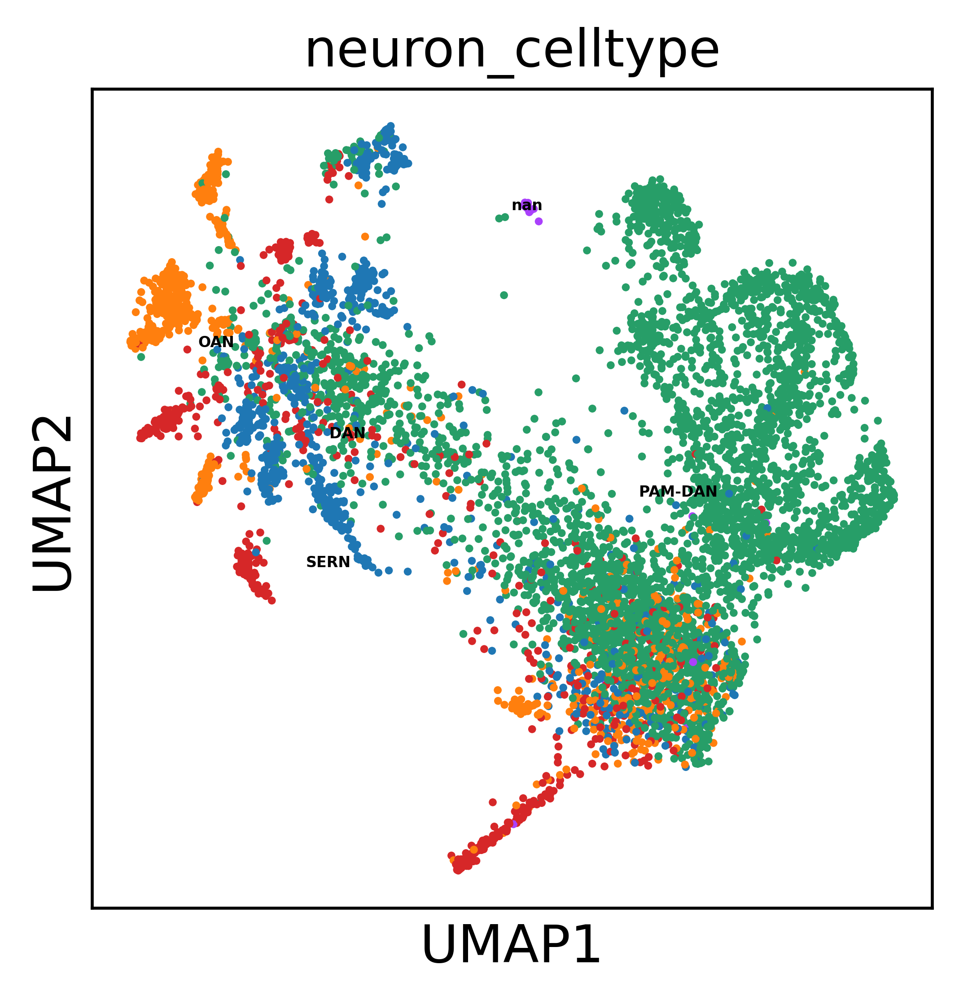

In [195]:
sc.pl.umap(adata_clustered, color = "neuron_celltype", legend_loc = 'on data', legend_fontsize=4)

In [ ]:
adata_clustered.obs['neuron_celltype'] = adata_clustered.obs['neuron_celltype'].astype(str)
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)

# Ensure sample names are aligned
matching_barcodes = adata.obs['sample'][adata.obs['sample'].isin(adata_clustered.obs['sample'])]

# Create a mapping from integrated_ozel_adata to adata
barcode_to_annotation = adata_clustered.obs['neuron_celltype'].reindex(matching_barcodes.index)

# Assign the new annotations to adata.obs
adata.obs.loc[barcode_to_annotation.index, 'neuron_celltype'] = barcode_to_annotation


## 75.00

In [5]:
sc.set_figure_params(dpi = 300)

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique annotation labels
unique_annotations = adata.obs['leiden_res_75.00_neuron'].unique()

# Generate a large set of distinct colors
num_colors = len(unique_annotations)
palette = sns.color_palette("tab20", num_colors)  # Use "tab20", "tab20b", "tab20c", or "hsv" for more colors
color_dict = dict(zip(unique_annotations, palette))

# Assign colors to annotation categories
sc.pl.umap(adata, color='leiden_res_75.00_neuron', palette=color_dict, legend_loc='on data', legend_fontsize=1)


In [18]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_75.00_neuron'] == '431', 'neuron_celltype'] = 'LPC1'

In [22]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_75.00_neuron'] == '305', 'neuron_celltype'] = 'LC10a'

In [25]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_75.00_neuron'] == '211', 'neuron_celltype'] = 'LC10b'

In [37]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_75.00_neuron'] == '234', 'neuron_celltype'] = 'LC16'

In [464]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_75.00_neuron'] == '703', 'neuron_celltype'] = 'LC14'

In [454]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_75.00_neuron'] == '525', 'neuron_celltype'] = 'LC13'

In [482]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_75.00_neuron'] == '513', 'neuron_celltype'] = 'LC18'

## 100.00

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns

# Get unique annotation labels
unique_annotations = adata.obs['leiden_res_100.00_neuron'].unique()

# Generate a large set of distinct colors
num_colors = len(unique_annotations)
palette = sns.color_palette("tab20", num_colors)  # Use "tab20", "tab20b", "tab20c", or "hsv" for more colors
color_dict = dict(zip(unique_annotations, palette))

# Assign colors to annotation categories
sc.pl.umap(adata, color='leiden_res_100.00_neuron', palette=color_dict, legend_loc='on data', legend_fontsize=1)


In [28]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_100.00_neuron'] == '484', 'neuron_celltype'] = 'LC6'

In [32]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_100.00_neuron'] == '261', 'neuron_celltype'] = 'LC10d'

In [35]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_100.00_neuron'] == '59', 'neuron_celltype'] = 'LLPC1'

In [458]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'LC16', 'neuron_celltype'] = np.nan

In [459]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'LC14', 'neuron_celltype'] = np.nan

In [462]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['neuron_celltype'] == 'LC13', 'neuron_celltype'] = np.nan

In [460]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_100.00_neuron'] == '230', 'neuron_celltype'] = 'LC16'

In [463]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_100.00_neuron'] == '561', 'neuron_celltype'] = 'LC13'

In [485]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_100.00_neuron'] == '413', 'neuron_celltype'] = 'LC21'

In [486]:
adata.obs['neuron_celltype'] = adata.obs['neuron_celltype'].astype(str)
adata.obs.loc[adata.obs['leiden_res_100.00_neuron'] == '101', 'neuron_celltype'] = 'LC11'